<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#1.-Import-packages" data-toc-modified-id="1.-Import-packages-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>1. Import packages</a></span></li><li><span><a href="#2.-Set-variables" data-toc-modified-id="2.-Set-variables-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>2. Set variables</a></span></li><li><span><a href="#3.-Set-functions" data-toc-modified-id="3.-Set-functions-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>3. Set functions</a></span></li><li><span><a href="#4.-Load-data" data-toc-modified-id="4.-Load-data-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>4. Load data</a></span></li><li><span><a href="#5.-Concat-data" data-toc-modified-id="5.-Concat-data-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>5. Concat data</a></span><ul class="toc-item"><li><span><a href="#6.1-Get-skewed-columns" data-toc-modified-id="6.1-Get-skewed-columns-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>6.1 Get skewed columns</a></span></li><li><span><a href="#6.2-Get-highly-correlated-columns" data-toc-modified-id="6.2-Get-highly-correlated-columns-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>6.2 Get highly correlated columns</a></span></li></ul></li><li><span><a href="#7.-Load-processed-data" data-toc-modified-id="7.-Load-processed-data-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>7. Load processed data</a></span></li><li><span><a href="#13.-Catboost" data-toc-modified-id="13.-Catboost-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>13. Catboost</a></span><ul class="toc-item"><li><span><a href="#13.0-Catboost-datasets" data-toc-modified-id="13.0-Catboost-datasets-7.1"><span class="toc-item-num">7.1&nbsp;&nbsp;</span>13.0 Catboost datasets</a></span></li><li><span><a href="#13.1-Finding-the-best-one_hot_max_size-and-depth" data-toc-modified-id="13.1-Finding-the-best-one_hot_max_size-and-depth-7.2"><span class="toc-item-num">7.2&nbsp;&nbsp;</span>13.1 Finding the best one_hot_max_size and depth</a></span></li><li><span><a href="#13.2-Model-with-all-features" data-toc-modified-id="13.2-Model-with-all-features-7.3"><span class="toc-item-num">7.3&nbsp;&nbsp;</span>13.2 Model with all features</a></span></li><li><span><a href="#13.3-Finding-the-best-params" data-toc-modified-id="13.3-Finding-the-best-params-7.4"><span class="toc-item-num">7.4&nbsp;&nbsp;</span>13.3 Finding the best params</a></span></li><li><span><a href="#13.4-Final-model" data-toc-modified-id="13.4-Final-model-7.5"><span class="toc-item-num">7.5&nbsp;&nbsp;</span>13.4 Final model</a></span></li></ul></li><li><span><a href="#16.-Stacking" data-toc-modified-id="16.-Stacking-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>16. Stacking</a></span></li><li><span><a href="#17.--Ensemble" data-toc-modified-id="17.--Ensemble-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>17.  Ensemble</a></span></li><li><span><a href="#18.-Submit" data-toc-modified-id="18.-Submit-10"><span class="toc-item-num">10&nbsp;&nbsp;</span>18. Submit</a></span></li></ul></div>

# 1. Import packages

In [1]:
#%%time
%pylab inline
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import gc
gc.enable()
import sys

from sklearn.ensemble import *
from sklearn.metrics import *
from sklearn.model_selection import *
from sklearn.linear_model import *
from sklearn.cluster import *
from sklearn.pipeline import *
from sklearn.preprocessing import *
import xgboost as xgb
import lightgbm as lgb
import catboost as ctbst
from boruta import BorutaPy

import tensorflow
KERAS_BACKEND=tensorflow
import keras
from keras import *
from keras.utils import *
from keras.models import *
from keras.callbacks import *
from keras.optimizers import *
from keras.layers import *
from keras.layers.core import *
from keras.layers.recurrent import *
from keras.layers.normalization import *
from keras.layers.advanced_activations import *
from keras import backend as K
from keras.utils.vis_utils import model_to_dot

import matplotlib.pyplot as plt
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 20, 10
plt.style.use('fivethirtyeight')
plt.figure(figsize=(20, 10))
import seaborn as sns
import plotly
from plotly.offline import *
import plotly.plotly as py
from plotly.graph_objs import *
from pylab import *
init_notebook_mode(connected=True)
import shap
from tqdm import *
from IPython.display import *
import missingno

import threading as th
import multiprocessing as mp
import itertools

Populating the interactive namespace from numpy and matplotlib


Using TensorFlow backend.


<Figure size 1440x720 with 0 Axes>

# 2. Set variables

In [2]:
#cannot use seed cause python has function with the same name
random_state = 1
path = 'D:/Python/Kaggle/IEEE-CIS/'
n_threads = mp.cpu_count()-1 #th.active_count()

# 3. Set functions

In [3]:
def plot_wide(f):
    def wrapped():
        rcParams['figure.figsize'] = 20, 10
    return wrapped

def data_convert(df, col_exc, do_print=True):
    
    columns = [column for column in df.columns if column not in [col_exc]]
    
    for column in columns:

        if (df[column].dtype not in ['datetime64[ns]', 'object', 'float']):
            
            mn = df[column].min()
            mx = df[column].max()
            
            #uint
            if (mn >= 0):
                
                #uint8
                if (mx < 255):
                    try:
                        column_type = str(df[column].dtype)
                        df[column] = df[column].astype('uint8')
                        if do_print:
                            print(
                                column,
                                'with type',
                                column_type,
                                'converted to uint8'
                            )
                    except:
                        print(sys.exc_info()[0])
                
                #uint16
                elif (mx < 65535):
                    try:
                        column_type = str(df[column].dtype)
                        df[column] = df[column].astype('uint16')
                        if do_print:
                            print(
                                column,
                                'with type',
                                column_type,
                                'converted to uint16'
                            )
                    except:
                        print(sys.exc_info()[0])
                        
                #uint32
                elif (mx < 4294967295):
                    try:
                        column_type = str(df[column].dtype)
                        df[column] = df[column].astype('uint32')
                        if do_print:
                            print(
                                column,
                                'with type',
                                column_type,
                                'converted to uint32'
                            )
                    except:
                        print(sys.exc_info()[0])
                        
                #uint64
                elif (mx < 18446744073709551615):
                    try:
                        column_type = str(df[column].dtype)
                        df[column] = df[column].astype('uint64')
                        if do_print:
                            print(
                                column,
                                'with type',
                                column_type,
                                'converted to uint64'
                            )
                    except:
                        print(sys.exc_info()[0])
            
            #int8
            elif ((-128 <= mn <= 127) & (-128 <= mx <= 127)):
                try:
                    column_type = str(df[column].dtype)
                    df[column] = df[column].astype('int8')
                    if do_print:
                        print(
                            column,
                            'with type',
                            column_type,
                            'converted to int8'
                        )
                except:
                    print(sys.exc_info()[0])
                
            #int16
            elif ((-32768 <= mn <= 32767) & (-32768 <= mx <= 32767)):
                try:
                    column_type = str(df[column].dtype)
                    df[column] = df[column].astype('int16')
                    if do_print:
                        print(
                            column,
                            'with type',
                            column_type,
                            'converted to int16'
                        )
                except:
                    print(sys.exc_info()[0])
                
            #int32
            elif ((-2147483648 <= mn <= 2147483647) & (-2147483648 <= mx <= 2147483647)):
                try:
                    column_type = str(df[column].dtype)
                    df[column] = df[column].astype('int32')
                    if do_print:
                        print(
                            column,
                            'with type',
                            column_type,
                            'converted to int32'
                        )
                except:
                    print(sys.exc_info()[0])
        
        elif (df[column].dtype == 'float'):
            
            try:
                column_type = str(df[column].dtype)
                df[column] = df[column].astype('float32')
                if do_print:
                    print(
                        column,
                        'with type',
                        column_type,
                        'converted to float32'
                    )
            except:
                print(sys.exc_info()[0]) 
        
        else:
            if do_print:
                print(
                    column,
                    'has no convertable type'
                )
                
    return df
            
def data_desc(df):
    
    df_types = pd.DataFrame(df.dtypes.reset_index()).rename(columns={'index': 'column', 0: 'type'})
    
    for c in df_types['column'].values:
        
        null = 'EXIST' if df[c].isnull().any()==True else 'DOES NOT EXIST'
        column_type = df_types[df_types['column']==c]['type'].values[0]
        
        print(
            'NULL VALUES',
            null,
            'WITH FORMAT',
            column_type,
            'IN COLUMN',
            c
        )
        
    print(df.dtypes)
    return df.describe().T

#@plot_wide
def simple_analysis(df, cat_feat=None, target=''):
    
    features = df.columns
    dt = df.dtypes
    
    sns.heatmap(df.corr())
    plt.show()
    
    columns = pd.DataFrame(df.dtypes).reset_index().rename(columns={'index': 'column', 0: 'type'})
    dig_feat = columns[columns['type']!='object']['column'].values
    
    for d in dig_feat:
        
        sns.distplot(df[d])
        plt.show()
        
    if cat_feat != None:
        
        for c in cat_feat:
            
            #sns.stripplot(
            #    x=target,
            #    y=c,
            #    data=df,
            #    jitter=True,
            #    linewidth=1
            #)
            sns.boxplot(
                x=c,
                y=target,
                data=df
            )
            plt.show()
            
def data_skew(df):
    
    sk_df = pd.DataFrame(
        [
            {
                'column': c,
                'uniq': df[c].nunique(),
                'skewness': df[c].value_counts(normalize=True).values[0] * 100
            } for c in df.columns
        ]
    )
    sk_df = sk_df.sort_values('skewness', ascending=False)
    return sk_df
            
def plot_feat_imp(feat, imp, n_feat):
    
    feat = feat[:n_feat]
    df_temp = pd.DataFrame(feat, columns=['feature'])
    df_temp['imp'] = imp[:n_feat]
    df_temp.sort_values(
        by=['imp'],
        ascending=True,
        inplace=True
    )
    
    n_feat = len(feat)
    
    plt.barh(
        range(n_feat),
        df_temp['imp'],
        align='center'
    )
    
    plt.yticks(np.arange(n_feat), df_temp['feature'])
    plt.xlabel(xlabel('Importance'))
    plt.ylabel('Feature')
    del df_temp; gc.collect()
    
def plot_vc(x, y_train, y_valid, xlabel='DEPTH'):
    '''
    plt.title('Validation curve')
    plt.xlabel('depth')
    plt.ylabel('roc_auc')
    sns.lineplot(
        x=x,
        y=y_train,
        label='Train'
    )

    sns.lineplot(
        x=x,
        y=y_valid,
        label='Valid'
    )
    
    plt.show()
    '''
    train = Scatter(
        x=x,
        y=y_train,
        name='Train',
        line=dict(
            color='rgba(240, 65, 65, .9)',
            shape='hvh'
        ),
        mode='lines+markers',
        connectgaps=True
    )
    
    valid = Scatter(
        x=x,
        y=y_valid,
        name='Valid',
        line=dict(
            color='rgba(65, 100, 240, .9)',
            shape='hvh'
        ),
        mode='lines+markers',
        connectgaps=True
    )
    
    data = [train, valid]
    
    layout = dict(
        title='Validation curve',
        legend=dict(
            x=.9,
            y=1
        ),
        yaxis = dict(
            title='ROC AUC',
            autorange=False,
            range=[0, 1.1],
            #tickformat='0.0%'
        ),
        xaxis = dict(
            title=xlabel,
            dtick=1
        ),
        showlegend=True
    )
    
    fig = dict(
        data=data,
        layout=layout
    )
    
    iplot(fig)
            
def model_mean(**kwargs):
    
    X_train = kwargs['X_train']
    X_valid = kwargs['X_valid']
    X_test = kwargs['X_test']
    y_train = kwargs['y_train']
    y_valid = kwargs['y_valid']
    y_test = kwargs['y_test']
    feat = kwargs['feat']

    if 'cat_feat' in kwargs.keys():
        cat_feat = kwargs['cat_feat']

    model = kwargs['model']
    random_state = kwargs['random_state']
    samples = kwargs['samples']
    info = kwargs['info']
    y_valid_preds = []
    y_test_preds = []
    
    for i in range(0, samples):
        
        if 'cat_feat' in kwargs.keys():
            
            y_valid_pred_, y_test_pred_ = model(
                X_train,
                X_valid,
                X_test,
                y_train,
                y_valid,
                y_test,
                feat,
                cat_feat,
                random_state+i
            )
            
        else:
            
            y_valid_pred_, y_test_pred_ = model(
                X_train,
                X_valid,
                X_test,
                y_train,
                y_valid,
                y_test,
                feat,
                random_state+1
            )

        y_valid_preds.append(y_valid_pred_)
        y_test_preds.append(y_test_pred_)
    
    y_valid_pred = np.mean(y_valid_preds, axis=0)
    y_test_pred = np.mean(y_test_preds, axis=0)
    
    try:
        
        print(
            samples,
            info,
            'MODELS',
            '\nROC_AUC va;od score:',
            roc_auc_score(y_valid, y_valid_pred)
        )
        
    except:
        
        'CANNOT CALC METRIC'
    
    print(
        samples,
        info,
        'MODELS',
        '\nROC_AUC test score:',
        roc_auc_score(y_test, y_test_pred)
    )
   
    return y_valid_pred, y_test_pred

# 4. Load data

In [4]:
#%%time

train_identity = pd.read_csv(path + 'train_identity.csv')
train_transaction = pd.read_csv(path + 'train_transaction.csv')
test_identity = pd.read_csv(path + 'test_identity.csv')
test_transaction = pd.read_csv(path + 'test_transaction.csv')
sub = pd.read_csv(path + 'sample_submission.csv')

X_train = pd.merge(train_transaction, train_identity, on='TransactionID', how='left')
X_test = pd.merge(test_transaction, test_identity, on='TransactionID', how='left')

#X_train = data_convert(
#    df=X_train,
#    col_exc='isFraud'
#)
#
#X_test = data_convert(
#    df=X_test,
#    col_exc=None
#)

del train_identity, train_transaction, test_identity, test_transaction
gc.collect()

796

In [5]:
X_train.head(5)

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M


In [6]:
X_train.shape

(590540, 434)

In [7]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 590540 entries, 0 to 590539
Columns: 434 entries, TransactionID to DeviceInfo
dtypes: float64(399), int64(4), object(31)
memory usage: 1.9+ GB


In [10]:
X_test.shape

(506691, 433)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 590540 entries, 0 to 590539
Columns: 434 entries, TransactionID to DeviceInfo
dtypes: float64(399), int64(4), object(31)
memory usage: 1.9+ GB
None


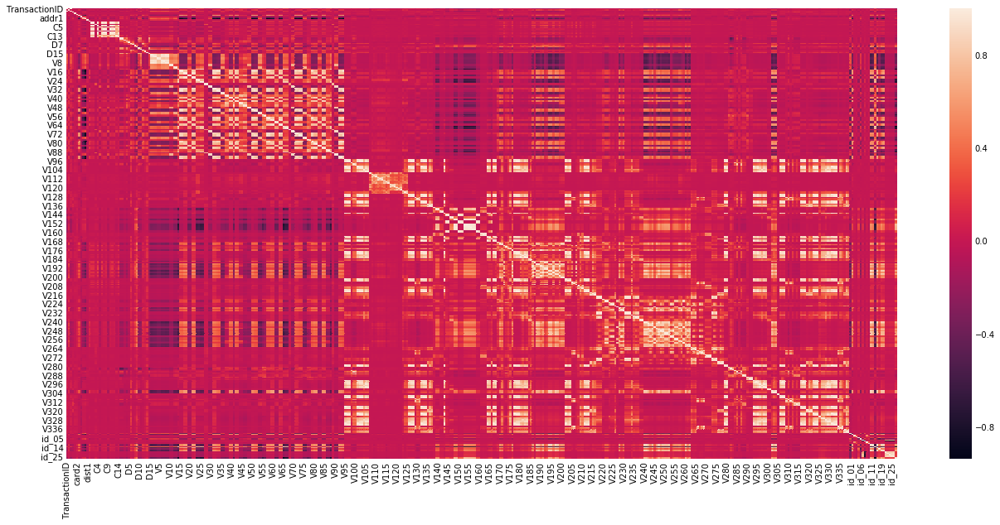

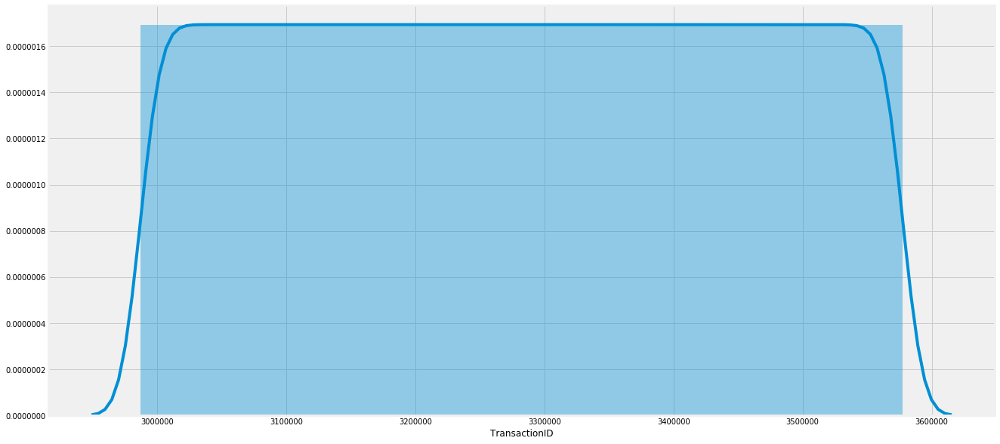

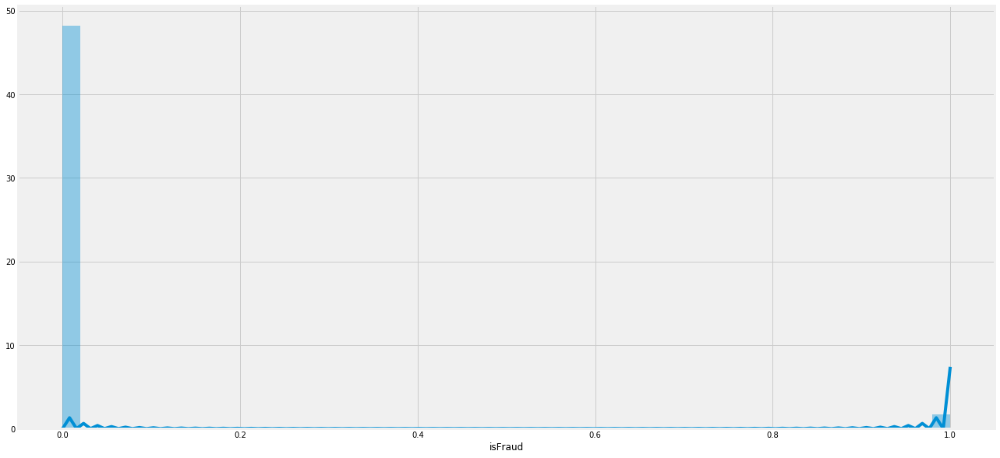

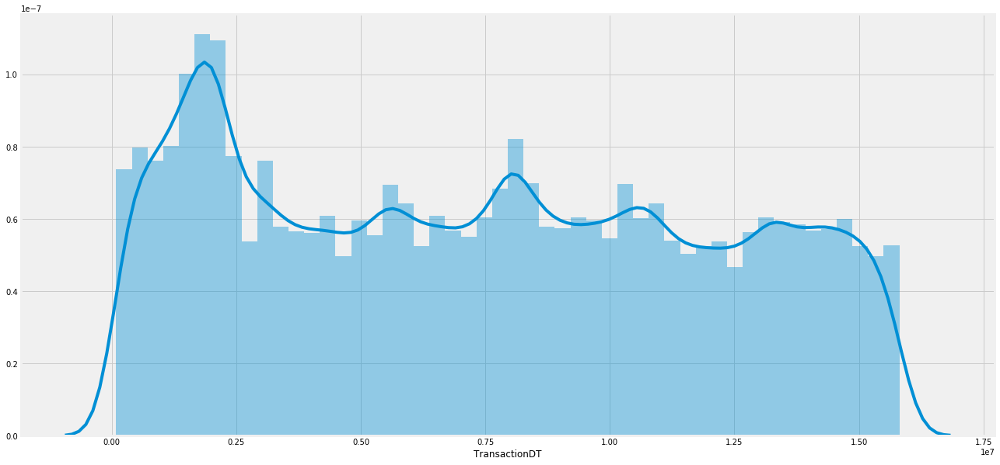

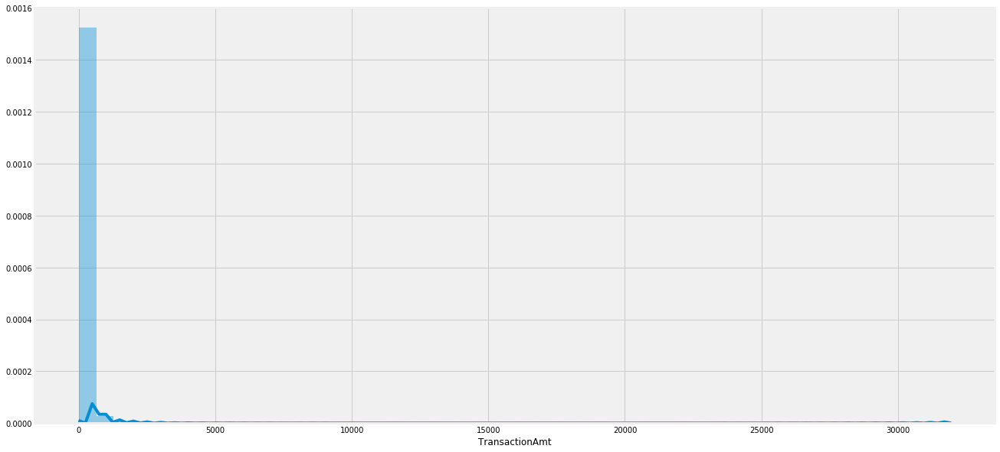

...

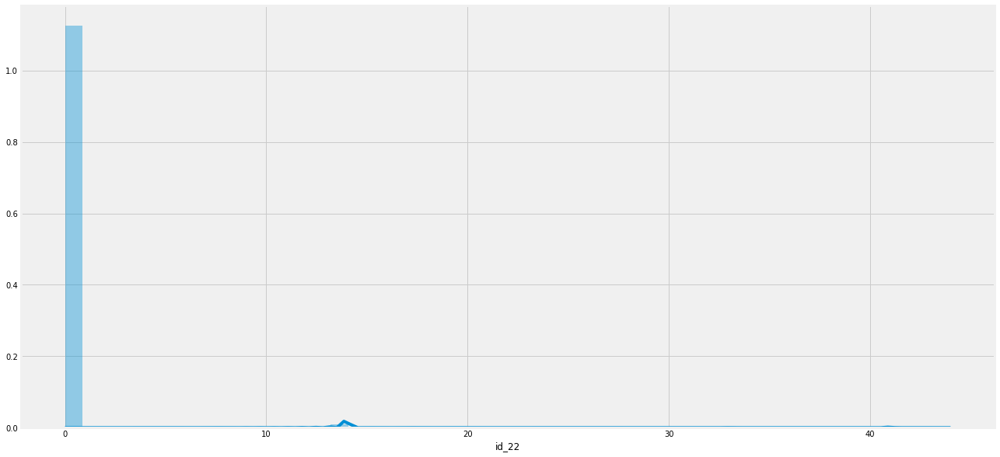

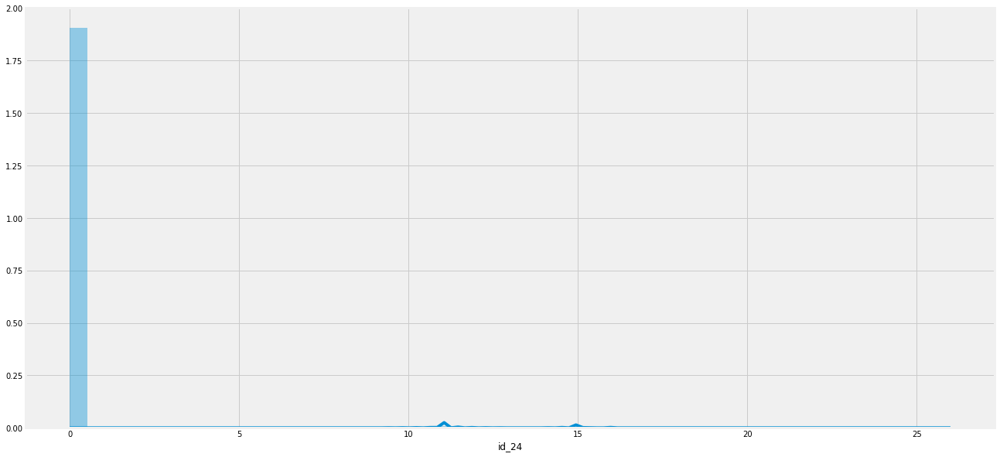

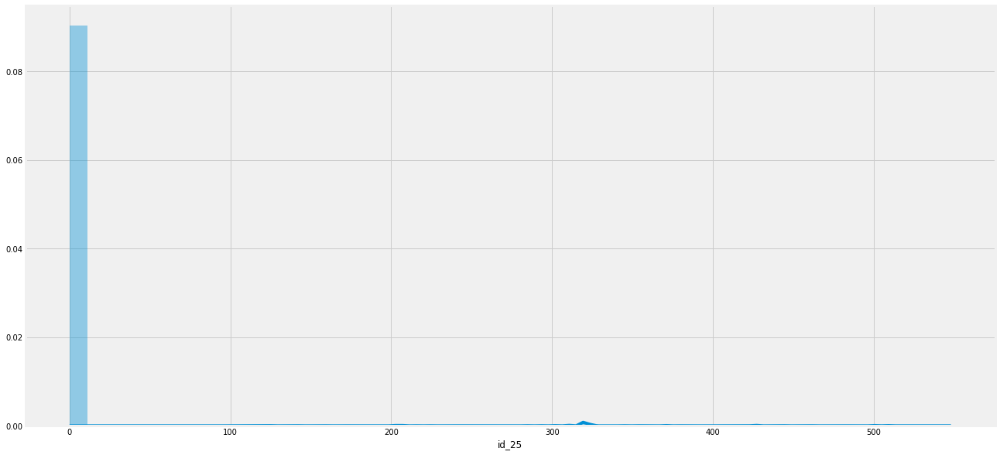

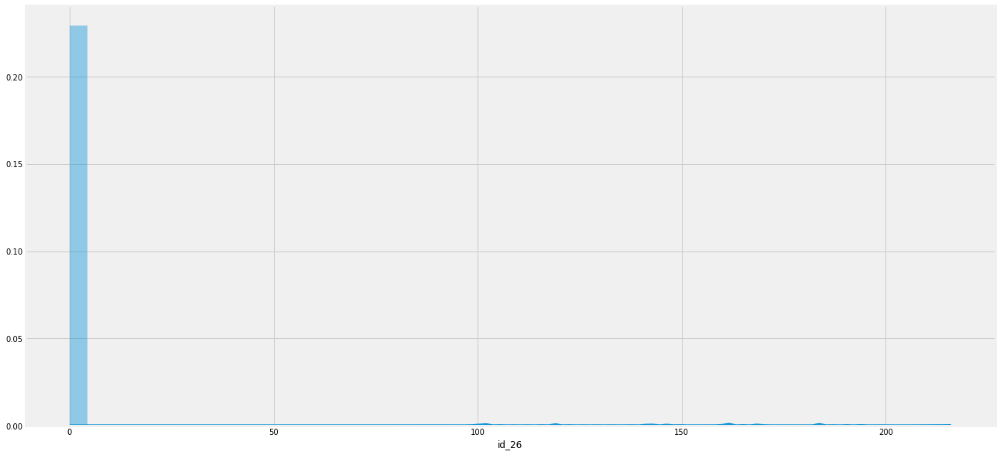

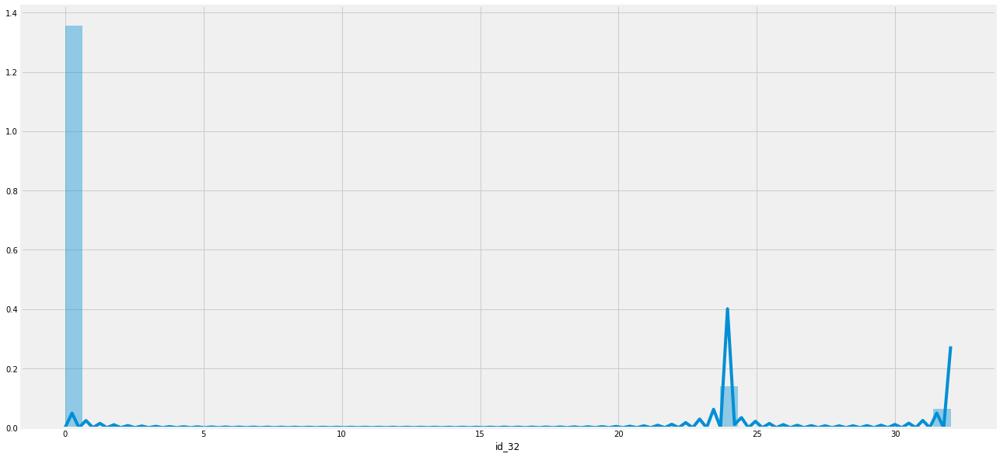

,count,mean,std,min,25%,50%,75%,max
TransactionID,590540.0,3.282270e+06,1.704744e+05,2987000.000,3134634.750,3282269.500,3429904.25,3.577539e+06
isFraud,590540.0,3.499001e-02,1.837546e-01,0.000,0.000,0.000,0.00,1.000000e+00
TransactionDT,590540.0,7.372311e+06,4.617224e+06,86400.000,3027057.750,7306527.500,11246620.00,1.581113e+07
TransactionAmt,590540.0,1.350272e+02,2.391625e+02,0.251,43.321,68.769,125.00,3.193739e+04
card1,590540.0,9.898735e+03,4.901170e+03,1000.000,6019.000,9678.000,14184.00,1.839600e+04
card2,581607.0,3.625555e+02,1.577932e+02,100.000,214.000,361.000,512.00,6.000000e+02
card3,588975.0,1.531949e+02,1.133644e+01,100.000,150.000,150.000,150.00,2.310000e+02
card5,586281.0,1.992789e+02,4.124445e+01,100.000,166.000,226.000,226.00,2.370000e+02
addr1,524834.0,2.907338e+02,1.017411e+02,100.000,204.000,299.000,330.00,5.400000e+02
addr2,524834.0,8.680063e+01,2.690623e+00,10.000,87.000,87.000,87.00,1.020000e+02


In [11]:
rcParams['figure.figsize'] = 20, 10
print(X_train.info())
simple_analysis(
    df=X_train.fillna(0),
    cat_feat=None,
    target='isFraud'
)
X_train.describe().T

<class 'pandas.core.frame.DataFrame'>
Int64Index: 506691 entries, 0 to 506690
Columns: 433 entries, TransactionID to DeviceInfo
dtypes: float64(399), int64(3), object(31)
memory usage: 1.6+ GB
None


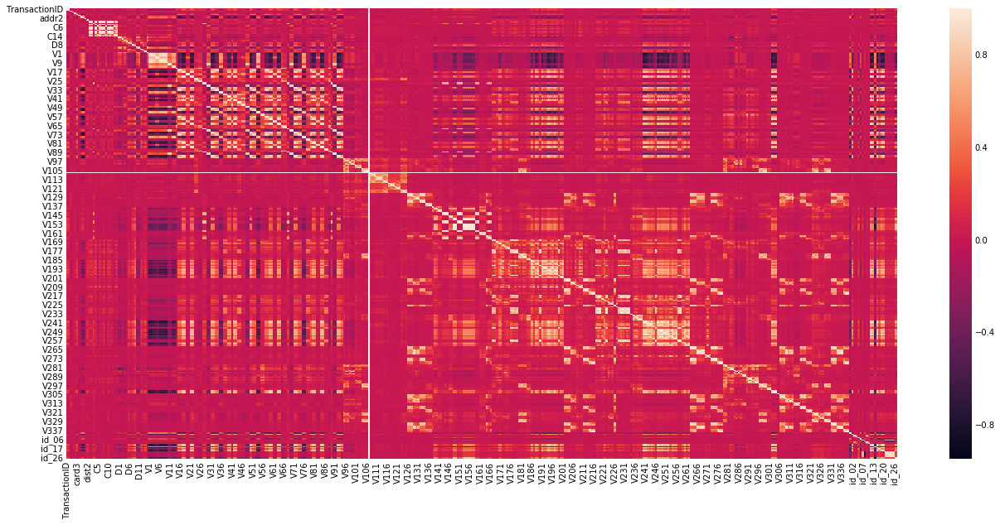

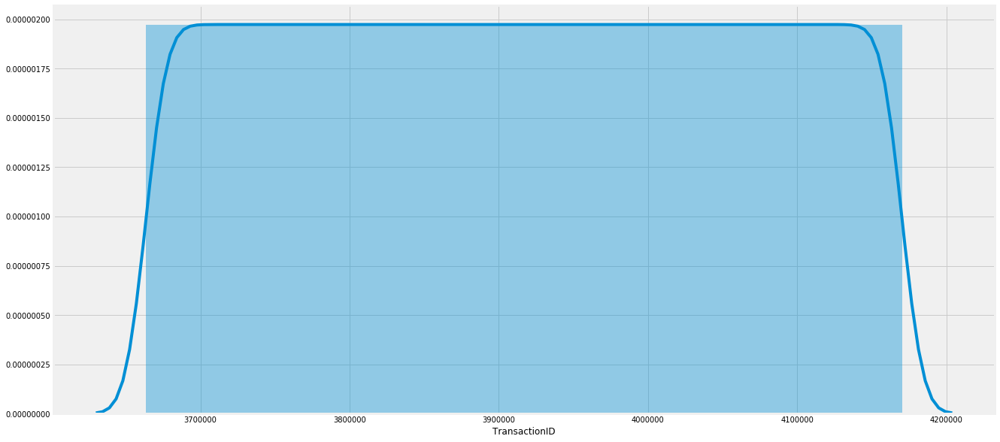

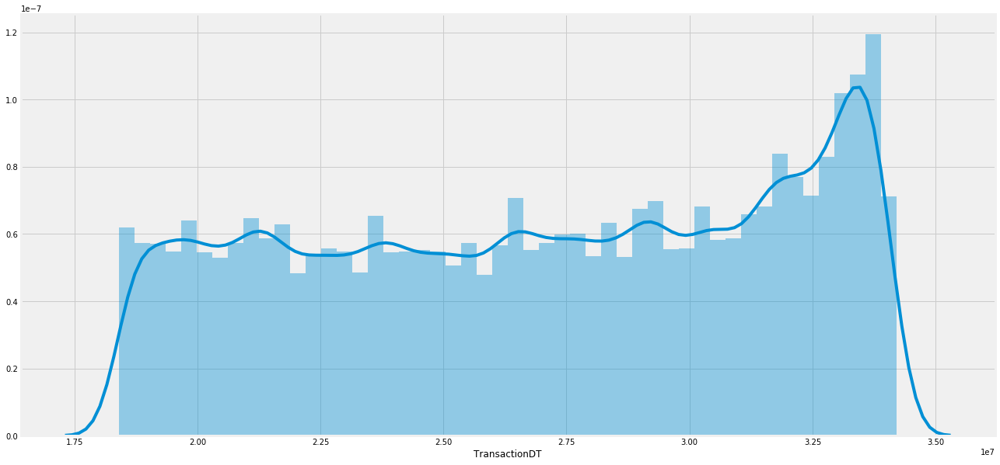

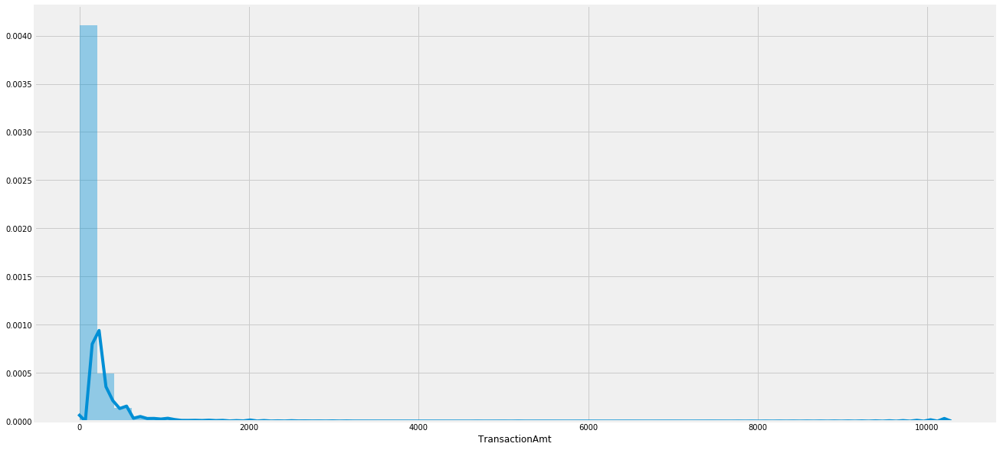

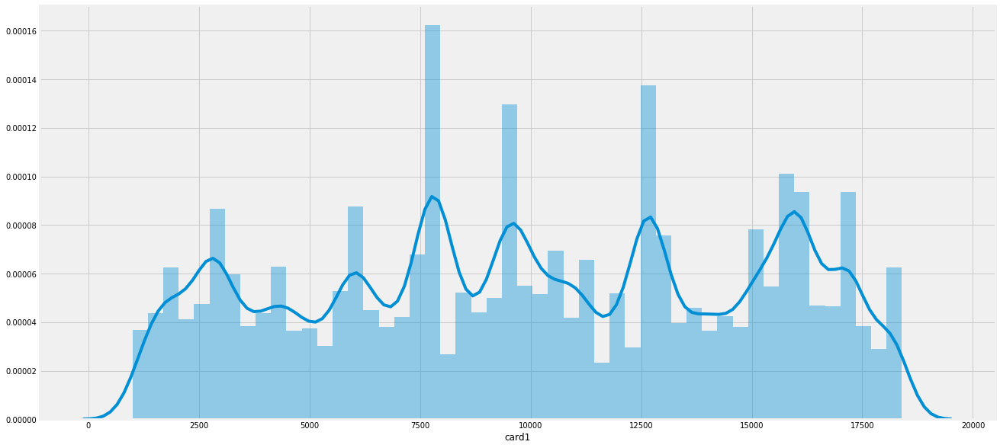

...

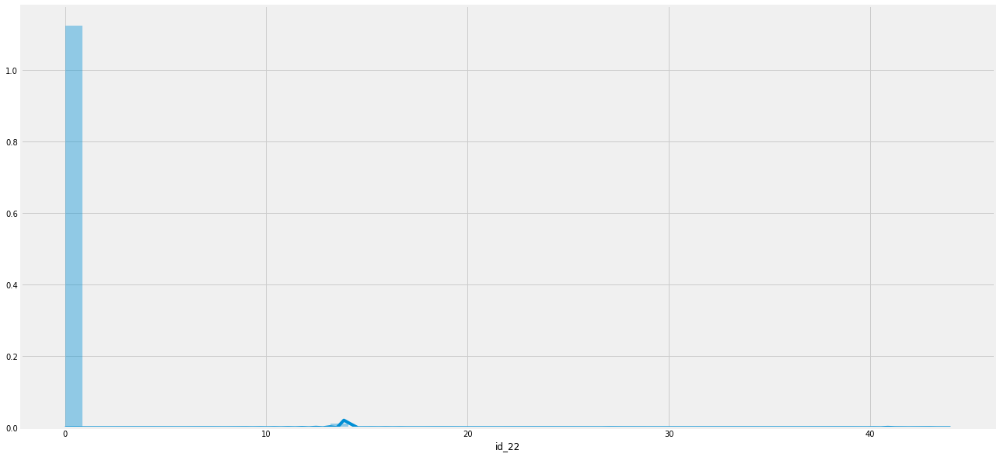

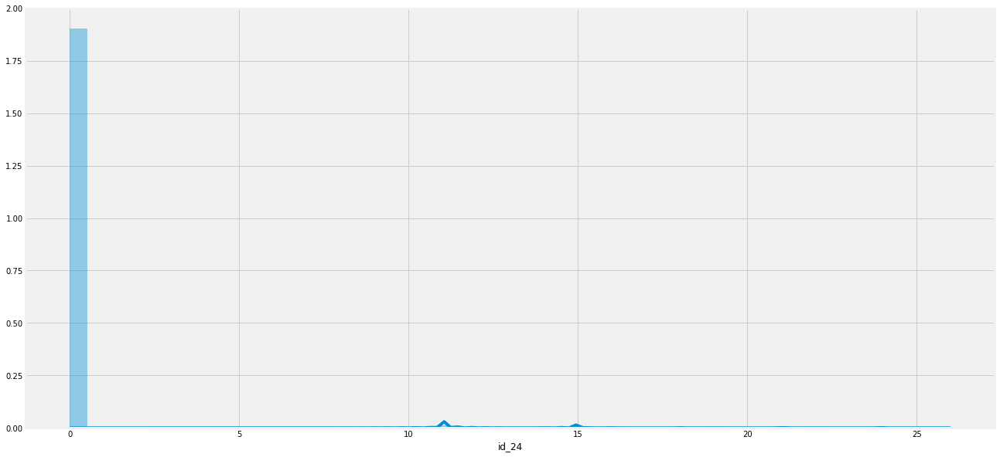

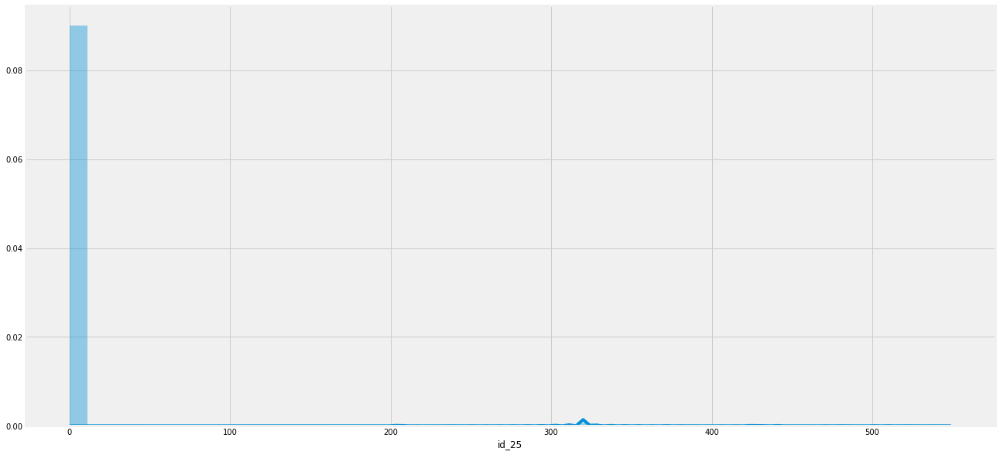

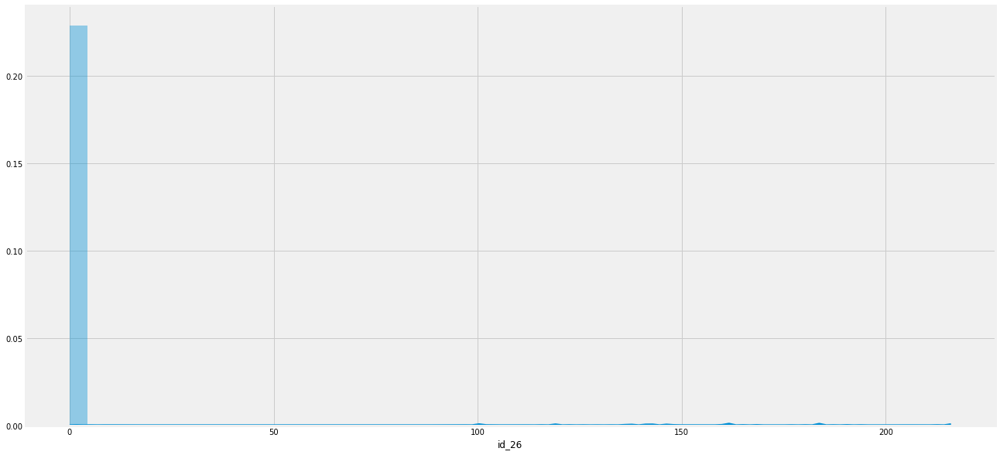

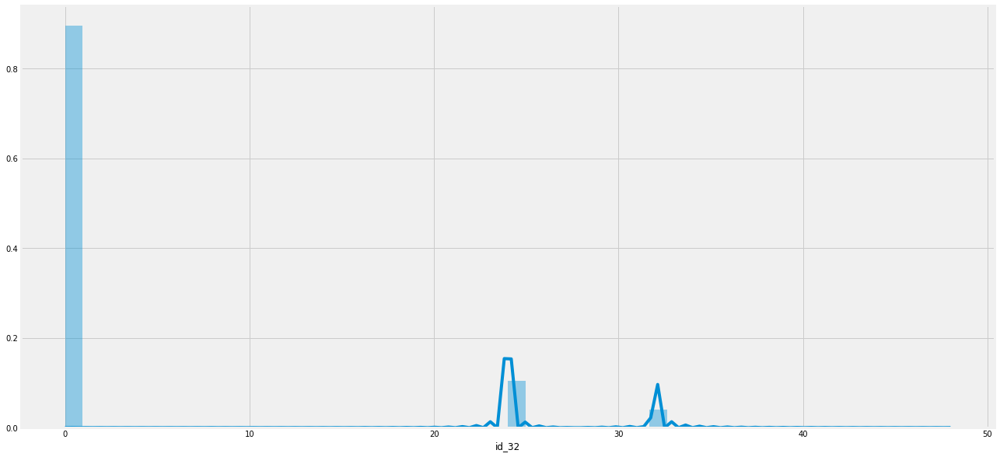

,count,mean,std,min,25%,50%,75%,max
TransactionID,590540.0,3.282270e+06,1.704744e+05,2987000.000,3134634.750,3282269.500,3429904.25,3.577539e+06
isFraud,590540.0,3.499001e-02,1.837546e-01,0.000,0.000,0.000,0.00,1.000000e+00
TransactionDT,590540.0,7.372311e+06,4.617224e+06,86400.000,3027057.750,7306527.500,11246620.00,1.581113e+07
TransactionAmt,590540.0,1.350272e+02,2.391625e+02,0.251,43.321,68.769,125.00,3.193739e+04
card1,590540.0,9.898735e+03,4.901170e+03,1000.000,6019.000,9678.000,14184.00,1.839600e+04
card2,581607.0,3.625555e+02,1.577932e+02,100.000,214.000,361.000,512.00,6.000000e+02
card3,588975.0,1.531949e+02,1.133644e+01,100.000,150.000,150.000,150.00,2.310000e+02
card5,586281.0,1.992789e+02,4.124445e+01,100.000,166.000,226.000,226.00,2.370000e+02
addr1,524834.0,2.907338e+02,1.017411e+02,100.000,204.000,299.000,330.00,5.400000e+02
addr2,524834.0,8.680063e+01,2.690623e+00,10.000,87.000,87.000,87.00,1.020000e+02


In [13]:
rcParams['figure.figsize'] = 20, 10
print(X_test.info())
simple_analysis(
    df=X_test.fillna(0),
    cat_feat=None,
    target='isFraud'
)
X_train.describe().T

In [13]:
target = 'isFraud'

# 5. Concat data

In [14]:
df_full = pd.concat([X_train.drop(labels=[target], axis=1), X_test], axis=0)
df_full.shape

(1097231, 433)

In [15]:
gc.collect()

116

In [16]:
cat_columns = df_full.select_dtypes(include=['object']).columns

In [9]:
def column_convert(df, column, dtype):
    if dtype=='object':
        print(
            'COLUMN:',
            column,
            '\nUNIQUE VALUES:',
            len(df[column].unique()),
            '\nNULL VALUES:',
            df[df[column].isnull()].shape[0],
            #'\nMIN VALUE:',
            #df[column].min(),
            #'\nMAX VALUE:',
            #df[column].max(),
            '\nACTUAL TYPE:',
            dtype,
            '\ndataset examples',
            df.shape[0],
            '\n', 
            '-'*50
        )
    else:
        print(
            'COLUMN:',
            column,
            '\nUNIQUE VALUES:',
            len(df[column].unique()),
            '\nNULL VALUES:',
            df[df[column].isnull()].shape[0],
            '\nMIN VALUE:',
            df[column].min(),
            '\nMAX VALUE:',
            df[column].max(),
            '\nACTUAL TYPE:',
            dtype,
            '\ndataset examples',
            df.shape[0],
            '\n', 
            '-'*50
        )

##### TransactionDT: timedelta from a given reference datetime (not an actual timestamp)
##### TransactionAMT: transaction payment amount in USD
##### ProductCD: product code, the product for each transaction
##### card1 - card6: payment card information, such as card type, card category, issue bank, country, etc.
##### addr: address
##### dist: distance
##### P_ and (R__) emaildomain: purchaser and recipient email domain
##### C1-C14: counting, such as how many addresses are found to be associated with the payment card, etc. The actual meaning is masked.
##### D1-D15: timedelta, such as days between previous transaction, etc.
##### M1-M9: match, such as names on card and address, etc.
##### Vxxx: Vesta engineered rich features, including ranking, counting, and other entity relations.
##### Categorical Features:
##### ProductCD
##### card1 - card6
##### addr1, addr2
##### Pemaildomain Remaildomain
##### M1 - M9

In [185]:
for c in df_full.columns:
    column_convert(df_full, c, df_full[c].dtype)

COLUMN: TransactionID 
UNIQUE VALUES: 1097231 
NULL VALUES: 0 
MIN VALUE: 2987000 
MAX VALUE: 4170239 
ACTUAL TYPE: int64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: TransactionDT 
UNIQUE VALUES: 1068035 
NULL VALUES: 0 
MIN VALUE: 86400 
MAX VALUE: 34214345 
ACTUAL TYPE: int64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: TransactionAmt 
UNIQUE VALUES: 29806 
NULL VALUES: 0 
MIN VALUE: 0.018000000000000002 
MAX VALUE: 31937.391 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: ProductCD 
UNIQUE VALUES: 5 
NULL VALUES: 0 
ACTUAL TYPE: object 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: card1 
UNIQUE VALUES: 17091 
NULL VALUES: 0 
MIN VALUE: 1000 
MAX VALUE: 18397 
ACTUAL TYPE: int64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: card2 
UNIQUE VALUES: 502 
NULL VALU

UNIQUE VALUES: 56 
NULL VALUES: 245823 
MIN VALUE: 0.0 
MAX VALUE: 54.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: V38 
UNIQUE VALUES: 56 
NULL VALUES: 245823 
MIN VALUE: 0.0 
MAX VALUE: 54.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: V39 
UNIQUE VALUES: 23 
NULL VALUES: 245823 
MIN VALUE: 0.0 
MAX VALUE: 30.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: V40 
UNIQUE VALUES: 26 
NULL VALUES: 245823 
MIN VALUE: 0.0 
MAX VALUE: 31.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: V41 
UNIQUE VALUES: 3 
NULL VALUES: 245823 
MIN VALUE: 0.0 
MAX VALUE: 1.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: V42 
UNIQUE VALUES: 10 
NULL VALUES: 245823 
MIN VALUE: 0.0 
MAX VALUE: 8.0 


 --------------------------------------------------
COLUMN: V126 
UNIQUE VALUES: 15136 
NULL VALUES: 314 
MIN VALUE: 0.0 
MAX VALUE: 519038.5 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: V127 
UNIQUE VALUES: 33547 
NULL VALUES: 314 
MIN VALUE: 0.0 
MAX VALUE: 544500.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: V128 
UNIQUE VALUES: 20511 
NULL VALUES: 314 
MIN VALUE: 0.0 
MAX VALUE: 519038.5 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: V129 
UNIQUE VALUES: 2639 
NULL VALUES: 314 
MIN VALUE: 0.0 
MAX VALUE: 64800.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: V130 
UNIQUE VALUES: 16251 
NULL VALUES: 314 
MIN VALUE: 0.0 
MAX VALUE: 167200.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 ----------------------------------------------

MAX VALUE: 958320.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: V213 
UNIQUE VALUES: 14583 
NULL VALUES: 820866 
MIN VALUE: 0.0 
MAX VALUE: 928882.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: V214 
UNIQUE VALUES: 3817 
NULL VALUES: 820866 
MIN VALUE: 0.0 
MAX VALUE: 453750.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: V215 
UNIQUE VALUES: 4665 
NULL VALUES: 820866 
MIN VALUE: 0.0 
MAX VALUE: 756250.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: V216 
UNIQUE VALUES: 4196 
NULL VALUES: 820866 
MIN VALUE: 0.0 
MAX VALUE: 756250.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: V217 
UNIQUE VALUES: 305 
NULL VALUES: 840073 
MIN VALUE: 0.0 
MAX VALUE: 303.0 
ACTUAL TYPE: floa

UNIQUE VALUES: 108 
NULL VALUES: 15 
MIN VALUE: 0.0 
MAX VALUE: 106.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: V300 
UNIQUE VALUES: 16 
NULL VALUES: 7300 
MIN VALUE: 0.0 
MAX VALUE: 14.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: V301 
UNIQUE VALUES: 16 
NULL VALUES: 7300 
MIN VALUE: 0.0 
MAX VALUE: 14.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: V302 
UNIQUE VALUES: 18 
NULL VALUES: 15 
MIN VALUE: 0.0 
MAX VALUE: 16.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: V303 
UNIQUE VALUES: 22 
NULL VALUES: 15 
MIN VALUE: 0.0 
MAX VALUE: 20.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: V304 
UNIQUE VALUES: 19 
NULL VALUES: 15 
MIN VALUE: 0.0 
MAX VALUE: 17.0 
ACTUAL TYP

MIN VALUE: -13.0 
MAX VALUE: 11.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: id_04 
UNIQUE VALUES: 17 
NULL VALUES: 964426 
MIN VALUE: -28.0 
MAX VALUE: 0.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: id_05 
UNIQUE VALUES: 98 
NULL VALUES: 825616 
MIN VALUE: -81.0 
MAX VALUE: 52.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: id_06 
UNIQUE VALUES: 102 
NULL VALUES: 825616 
MIN VALUE: -100.0 
MAX VALUE: 0.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: id_07 
UNIQUE VALUES: 93 
NULL VALUES: 1087017 
MIN VALUE: -46.0 
MAX VALUE: 61.0 
ACTUAL TYPE: float64 
dataset examples 1097231 
 --------------------------------------------------
COLUMN: id_08 
UNIQUE VALUES: 98 
NULL VALUES: 1087017 
MIN VALUE: -100.0 
MAX VALUE: 0.0 
ACTUAL TYPE: 

In [9]:
X_train.loc[:10000].to_csv(path + 'test.csv', sep=';', decimal=',', index=None)

In [ ]:
trash_columns = [
    'TransactionID'
]

In [263]:
cat_columns

Index(['ProductCD', 'card4', 'card6', 'P_emaildomain', 'R_emaildomain', 'M1',
       'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'id_12', 'id_15',
       'id_16', 'id_23', 'id_27', 'id_28', 'id_29', 'id_30', 'id_31', 'id_33',
       'id_34', 'id_35', 'id_36', 'id_37', 'id_38', 'DeviceType',
       'DeviceInfo'],
      dtype='object')

In [17]:
set(df_full['ProductCD'])

{'C', 'H', 'R', 'S', 'W'}

In [18]:
encoder = LabelEncoder()

In [19]:
df_full['ProductCD'] = encoder.fit_transform(df_full['ProductCD'])

In [20]:
set(df_full['card4'])

{'american express', 'discover', 'mastercard', nan, 'visa'}

In [21]:
X_train['card4'].isnull().sum() + X_test['card4'].isnull().sum()

4663

<Figure size 1440x720 with 0 Axes>

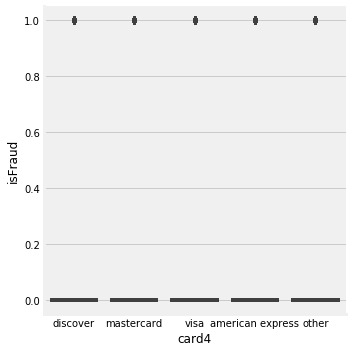

In [22]:
plt.figure(figsize=(20, 10))

sns.catplot(x='card4', y=target, data=X_train[['card4', target]].fillna('other'), kind='box')

plt.show()

In [23]:
set(df_full['card4'])

{'american express', 'discover', 'mastercard', nan, 'visa'}

In [24]:
df_full['card4'].fillna('other', inplace=True)

In [25]:
set(df_full['card4'])

{'american express', 'discover', 'mastercard', 'other', 'visa'}

In [26]:
encoder.fit_transform(['american express', 'discover', 'mastercard', 'other', 'visa'])

array([0, 1, 2, 3, 4], dtype=int64)

In [27]:
df_full['card4'] = encoder.fit_transform(df_full['card4'])
df_full['card4'] = df_full['card4'].replace([3], [-999])

In [28]:
df_full['card4'].value_counts()

 4      719649
 2      347386
 0       16009
 1        9524
-999      4663
Name: card4, dtype: int64

In [29]:
set(df_full['card6'])

{'charge card', 'credit', 'debit', 'debit or credit', nan}

In [30]:
df_full['card6'].fillna('other', inplace=True)

In [31]:
df_full['card6'].value_counts()

debit              824959
credit             267648
other                4578
debit or credit        30
charge card            16
Name: card6, dtype: int64

In [32]:
set(df_full['card6'])

{'charge card', 'credit', 'debit', 'debit or credit', 'other'}

In [33]:
encoder.fit_transform(['charge card', 'credit', 'debit', 'debit or credit', 'other'])

array([0, 1, 2, 3, 4], dtype=int64)

In [34]:
df_full['card6'] = encoder.fit_transform(df_full['card6'])
df_full['card6'] = df_full['card6'].replace([4], [-999])

In [35]:
df_full['card6'].value_counts()

 2      824959
 1      267648
-999      4578
 3          30
 0          16
Name: card6, dtype: int64

In [36]:
for e in sorted((df_full['P_emaildomain'].fillna('other.other').unique())):
    print(len(e.split('.')), e.split('.'))

2 ['aim', 'com']
2 ['anonymous', 'com']
2 ['aol', 'com']
2 ['att', 'net']
2 ['bellsouth', 'net']
2 ['cableone', 'net']
2 ['centurylink', 'net']
3 ['cfl', 'rr', 'com']
2 ['charter', 'net']
2 ['comcast', 'net']
2 ['cox', 'net']
2 ['earthlink', 'net']
2 ['embarqmail', 'com']
2 ['frontier', 'com']
2 ['frontiernet', 'net']
1 ['gmail']
2 ['gmail', 'com']
2 ['gmx', 'de']
3 ['hotmail', 'co', 'uk']
2 ['hotmail', 'com']
2 ['hotmail', 'de']
2 ['hotmail', 'es']
2 ['hotmail', 'fr']
2 ['icloud', 'com']
2 ['juno', 'com']
2 ['live', 'com']
3 ['live', 'com', 'mx']
2 ['live', 'fr']
2 ['mac', 'com']
2 ['mail', 'com']
2 ['me', 'com']
2 ['msn', 'com']
2 ['netzero', 'com']
2 ['netzero', 'net']
2 ['optonline', 'net']
2 ['other', 'other']
2 ['outlook', 'com']
2 ['outlook', 'es']
3 ['prodigy', 'net', 'mx']
2 ['protonmail', 'com']
2 ['ptd', 'net']
2 ['q', 'com']
2 ['roadrunner', 'com']
2 ['rocketmail', 'com']
2 ['sbcglobal', 'net']
3 ['sc', 'rr', 'com']
2 ['scranton', 'edu']
2 ['servicios-ta', 'com']
2 ['sudden

In [37]:
df_full['P_emaildomain'].fillna('other.other', inplace=True)

In [38]:
df_full['P_emaildomain'] = \
df_full['P_emaildomain'].replace(
    ['cfl.rr.com', 'hotmail.co.uk', 'live.com.mx', 'prodigy.net.mx', 'sc.rr.com', 'yahoo.co.jp', 'yahoo.co.uk', 'yahoo.com.mx'],
    ['cfl.rrcom', 'hotmail.couk', 'live.commx', 'prodigy.netmx', 'sc.rrcom', 'yahoo.cojp', 'yahoo.couk', 'yahoo.commx']
)

In [39]:
for e in sorted((df_full['P_emaildomain'].unique())):
    print(len(e.split('.')), e.split('.'))

2 ['aim', 'com']
2 ['anonymous', 'com']
2 ['aol', 'com']
2 ['att', 'net']
2 ['bellsouth', 'net']
2 ['cableone', 'net']
2 ['centurylink', 'net']
2 ['cfl', 'rrcom']
2 ['charter', 'net']
2 ['comcast', 'net']
2 ['cox', 'net']
2 ['earthlink', 'net']
2 ['embarqmail', 'com']
2 ['frontier', 'com']
2 ['frontiernet', 'net']
1 ['gmail']
2 ['gmail', 'com']
2 ['gmx', 'de']
2 ['hotmail', 'com']
2 ['hotmail', 'couk']
2 ['hotmail', 'de']
2 ['hotmail', 'es']
2 ['hotmail', 'fr']
2 ['icloud', 'com']
2 ['juno', 'com']
2 ['live', 'com']
2 ['live', 'commx']
2 ['live', 'fr']
2 ['mac', 'com']
2 ['mail', 'com']
2 ['me', 'com']
2 ['msn', 'com']
2 ['netzero', 'com']
2 ['netzero', 'net']
2 ['optonline', 'net']
2 ['other', 'other']
2 ['outlook', 'com']
2 ['outlook', 'es']
2 ['prodigy', 'netmx']
2 ['protonmail', 'com']
2 ['ptd', 'net']
2 ['q', 'com']
2 ['roadrunner', 'com']
2 ['rocketmail', 'com']
2 ['sbcglobal', 'net']
2 ['sc', 'rrcom']
2 ['scranton', 'edu']
2 ['servicios-ta', 'com']
2 ['suddenlink', 'net']
2 ['tw

In [40]:
df_full['P_emaildomain'] = np.where(df_full['P_emaildomain']=='gmail', 'gmail.com', df_full['P_emaildomain'])

In [41]:
for e in sorted((df_full['P_emaildomain'].unique())):
    print(len(e.split('.')), e.split('.'))

2 ['aim', 'com']
2 ['anonymous', 'com']
2 ['aol', 'com']
2 ['att', 'net']
2 ['bellsouth', 'net']
2 ['cableone', 'net']
2 ['centurylink', 'net']
2 ['cfl', 'rrcom']
2 ['charter', 'net']
2 ['comcast', 'net']
2 ['cox', 'net']
2 ['earthlink', 'net']
2 ['embarqmail', 'com']
2 ['frontier', 'com']
2 ['frontiernet', 'net']
2 ['gmail', 'com']
2 ['gmx', 'de']
2 ['hotmail', 'com']
2 ['hotmail', 'couk']
2 ['hotmail', 'de']
2 ['hotmail', 'es']
2 ['hotmail', 'fr']
2 ['icloud', 'com']
2 ['juno', 'com']
2 ['live', 'com']
2 ['live', 'commx']
2 ['live', 'fr']
2 ['mac', 'com']
2 ['mail', 'com']
2 ['me', 'com']
2 ['msn', 'com']
2 ['netzero', 'com']
2 ['netzero', 'net']
2 ['optonline', 'net']
2 ['other', 'other']
2 ['outlook', 'com']
2 ['outlook', 'es']
2 ['prodigy', 'netmx']
2 ['protonmail', 'com']
2 ['ptd', 'net']
2 ['q', 'com']
2 ['roadrunner', 'com']
2 ['rocketmail', 'com']
2 ['sbcglobal', 'net']
2 ['sc', 'rrcom']
2 ['scranton', 'edu']
2 ['servicios-ta', 'com']
2 ['suddenlink', 'net']
2 ['twc', 'com']
2

In [42]:
df_full['P_email'], df_full['P_domain'] = df_full['P_emaildomain'].str.split('.').str

In [43]:
df_full.drop(labels=['P_emaildomain'], axis=1, inplace=True)

In [44]:
set(df_full['P_domain'])

{'cojp',
 'com',
 'commx',
 'couk',
 'de',
 'edu',
 'es',
 'fr',
 'net',
 'netmx',
 'other',
 'rrcom'}

In [45]:
encoder.fit_transform([
    'cojp',
    'com',
    'commx',
    'couk',
    'de',
    'edu',
    'es',
    'fr',
    'net',
    'netmx',
    'other',
    'rrcom'
])

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11], dtype=int64)

In [46]:
df_full['P_domain'].value_counts()

com      878099
other    163648
net       45780
commx      4297
es         1762
fr         1124
de         1083
rrcom       595
couk        437
netmx       303
cojp        101
edu           2
Name: P_domain, dtype: int64

In [47]:
df_full['P_domain'] = encoder.fit_transform(df_full['P_domain'])
df_full['P_domain'] = df_full['P_domain'].replace([10], [-999])

In [48]:
df_full['P_domain'].value_counts()

 1      878099
-999    163648
 8       45780
 2        4297
 6        1762
 7        1124
 4        1083
 11        595
 3         437
 9         303
 0         101
 5           2
Name: P_domain, dtype: int64

In [49]:
df_full['P_email'].value_counts()

gmail           436796
yahoo           186568
other           163648
hotmail          87414
anonymous        71062
aol              52337
comcast          14474
icloud           12316
outlook          10797
att               7647
msn               7480
live              7296
sbcglobal         5767
verizon           5011
ymail             4075
bellsouth         3437
me                2713
cox               2657
optonline         1937
charter           1443
mail              1156
rocketmail        1105
earthlink          979
mac                862
netzero            706
frontier           594
roadrunner         583
juno               574
windstream         552
web                518
aim                468
embarqmail         464
twc                439
frontiernet        397
centurylink        386
q                  362
suddenlink         323
cfl                318
cableone           311
prodigy            303
gmx                298
sc                 277
protonmail         159
ptd        

In [50]:
set(df_full['P_email'])

{'aim',
 'anonymous',
 'aol',
 'att',
 'bellsouth',
 'cableone',
 'centurylink',
 'cfl',
 'charter',
 'comcast',
 'cox',
 'earthlink',
 'embarqmail',
 'frontier',
 'frontiernet',
 'gmail',
 'gmx',
 'hotmail',
 'icloud',
 'juno',
 'live',
 'mac',
 'mail',
 'me',
 'msn',
 'netzero',
 'optonline',
 'other',
 'outlook',
 'prodigy',
 'protonmail',
 'ptd',
 'q',
 'roadrunner',
 'rocketmail',
 'sbcglobal',
 'sc',
 'scranton',
 'servicios-ta',
 'suddenlink',
 'twc',
 'verizon',
 'web',
 'windstream',
 'yahoo',
 'ymail'}

In [51]:
encoder.fit_transform(
    [
    'aim',
    'anonymous',
    'aol',
    'att',
    'bellsouth',
    'cableone',
    'centurylink',
    'cfl',
    'charter',
    'comcast',
    'cox',
    'earthlink',
    'embarqmail',
    'frontier',
    'frontiernet',
    'gmail',
    'gmx',
    'hotmail',
    'icloud',
    'juno',
    'live',
    'mac',
    'mail',
    'me',
    'msn',
    'netzero',
    'optonline',
    'other',
    'outlook',
    'prodigy',
    'protonmail',
    'ptd',
    'q',
    'roadrunner',
    'rocketmail',
    'sbcglobal',
    'sc',
    'scranton',
    'servicios-ta',
    'suddenlink',
    'twc',
    'verizon',
    'web',
    'windstream',
    'yahoo',
    'ymail'  
    ]
)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45], dtype=int64)

In [52]:
df_full['P_email'] = encoder.fit_transform(df_full['P_email'])
df_full['P_email'] = df_full['P_email'].replace([27], [-999])

In [53]:
df_full['P_email'].value_counts()

 15     436796
 44     186568
-999    163648
 17      87414
 1       71062
 2       52337
 9       14474
 18      12316
 28      10797
 3        7647
 24       7480
 20       7296
 35       5767
 41       5011
 45       4075
 4        3437
 23       2713
 10       2657
 26       1937
 8        1443
 22       1156
 34       1105
 11        979
 21        862
 25        706
 13        594
 33        583
 19        574
 43        552
 42        518
 0         468
 12        464
 40        439
 14        397
 6         386
 32        362
 39        323
 7         318
 5         311
 29        303
 16        298
 36        277
 30        159
 31        140
 38         80
 37          2
Name: P_email, dtype: int64

In [54]:
set(df_full['R_emaildomain'])

{'aim.com',
 'anonymous.com',
 'aol.com',
 'att.net',
 'bellsouth.net',
 'cableone.net',
 'centurylink.net',
 'cfl.rr.com',
 'charter.net',
 'comcast.net',
 'cox.net',
 'earthlink.net',
 'embarqmail.com',
 'frontier.com',
 'frontiernet.net',
 'gmail',
 'gmail.com',
 'gmx.de',
 'hotmail.co.uk',
 'hotmail.com',
 'hotmail.de',
 'hotmail.es',
 'hotmail.fr',
 'icloud.com',
 'juno.com',
 'live.com',
 'live.com.mx',
 'live.fr',
 'mac.com',
 'mail.com',
 'me.com',
 'msn.com',
 nan,
 'netzero.com',
 'netzero.net',
 'optonline.net',
 'outlook.com',
 'outlook.es',
 'prodigy.net.mx',
 'protonmail.com',
 'ptd.net',
 'q.com',
 'roadrunner.com',
 'rocketmail.com',
 'sbcglobal.net',
 'sc.rr.com',
 'scranton.edu',
 'servicios-ta.com',
 'suddenlink.net',
 'twc.com',
 'verizon.net',
 'web.de',
 'windstream.net',
 'yahoo.co.jp',
 'yahoo.co.uk',
 'yahoo.com',
 'yahoo.com.mx',
 'yahoo.de',
 'yahoo.es',
 'yahoo.fr',
 'ymail.com'}

In [55]:
for e in sorted((df_full['R_emaildomain'].fillna('other.other').unique())):
    print(len(e.split('.')), e.split('.'), e)

2 ['aim', 'com'] aim.com
2 ['anonymous', 'com'] anonymous.com
2 ['aol', 'com'] aol.com
2 ['att', 'net'] att.net
2 ['bellsouth', 'net'] bellsouth.net
2 ['cableone', 'net'] cableone.net
2 ['centurylink', 'net'] centurylink.net
3 ['cfl', 'rr', 'com'] cfl.rr.com
2 ['charter', 'net'] charter.net
2 ['comcast', 'net'] comcast.net
2 ['cox', 'net'] cox.net
2 ['earthlink', 'net'] earthlink.net
2 ['embarqmail', 'com'] embarqmail.com
2 ['frontier', 'com'] frontier.com
2 ['frontiernet', 'net'] frontiernet.net
1 ['gmail'] gmail
2 ['gmail', 'com'] gmail.com
2 ['gmx', 'de'] gmx.de
3 ['hotmail', 'co', 'uk'] hotmail.co.uk
2 ['hotmail', 'com'] hotmail.com
2 ['hotmail', 'de'] hotmail.de
2 ['hotmail', 'es'] hotmail.es
2 ['hotmail', 'fr'] hotmail.fr
2 ['icloud', 'com'] icloud.com
2 ['juno', 'com'] juno.com
2 ['live', 'com'] live.com
3 ['live', 'com', 'mx'] live.com.mx
2 ['live', 'fr'] live.fr
2 ['mac', 'com'] mac.com
2 ['mail', 'com'] mail.com
2 ['me', 'com'] me.com
2 ['msn', 'com'] msn.com
2 ['netzero', 'c

In [56]:
df_full['R_emaildomain'].fillna('other.other', inplace=True)

In [57]:
df_full['R_emaildomain'] = \
df_full['R_emaildomain'].replace(
    ['cfl.rr.com', 'hotmail.co.uk', 'live.com.mx', 'prodigy.net.mx', 'sc.rr.com', 'yahoo.co.jp', 'yahoo.co.uk', 'yahoo.com.mx'],
    ['cfl.rrcom', 'hotmail.couk', 'live.commx', 'prodigy.netmx', 'sc.rrcom', 'yahoo.cojp', 'yahoo.couk', 'yahoo.commx']
)

In [58]:
for e in sorted((df_full['R_emaildomain'].unique())):
    print(len(e.split('.')), e.split('.'))

2 ['aim', 'com']
2 ['anonymous', 'com']
2 ['aol', 'com']
2 ['att', 'net']
2 ['bellsouth', 'net']
2 ['cableone', 'net']
2 ['centurylink', 'net']
2 ['cfl', 'rrcom']
2 ['charter', 'net']
2 ['comcast', 'net']
2 ['cox', 'net']
2 ['earthlink', 'net']
2 ['embarqmail', 'com']
2 ['frontier', 'com']
2 ['frontiernet', 'net']
1 ['gmail']
2 ['gmail', 'com']
2 ['gmx', 'de']
2 ['hotmail', 'com']
2 ['hotmail', 'couk']
2 ['hotmail', 'de']
2 ['hotmail', 'es']
2 ['hotmail', 'fr']
2 ['icloud', 'com']
2 ['juno', 'com']
2 ['live', 'com']
2 ['live', 'commx']
2 ['live', 'fr']
2 ['mac', 'com']
2 ['mail', 'com']
2 ['me', 'com']
2 ['msn', 'com']
2 ['netzero', 'com']
2 ['netzero', 'net']
2 ['optonline', 'net']
2 ['other', 'other']
2 ['outlook', 'com']
2 ['outlook', 'es']
2 ['prodigy', 'netmx']
2 ['protonmail', 'com']
2 ['ptd', 'net']
2 ['q', 'com']
2 ['roadrunner', 'com']
2 ['rocketmail', 'com']
2 ['sbcglobal', 'net']
2 ['sc', 'rrcom']
2 ['scranton', 'edu']
2 ['servicios-ta', 'com']
2 ['suddenlink', 'net']
2 ['tw

In [59]:
df_full['R_emaildomain'] = np.where(df_full['R_emaildomain']=='gmail', 'gmail.com', df_full['R_emaildomain'])

In [60]:
for e in sorted((df_full['R_emaildomain'].unique())):
    print(len(e.split('.')), e.split('.'))

2 ['aim', 'com']
2 ['anonymous', 'com']
2 ['aol', 'com']
2 ['att', 'net']
2 ['bellsouth', 'net']
2 ['cableone', 'net']
2 ['centurylink', 'net']
2 ['cfl', 'rrcom']
2 ['charter', 'net']
2 ['comcast', 'net']
2 ['cox', 'net']
2 ['earthlink', 'net']
2 ['embarqmail', 'com']
2 ['frontier', 'com']
2 ['frontiernet', 'net']
2 ['gmail', 'com']
2 ['gmx', 'de']
2 ['hotmail', 'com']
2 ['hotmail', 'couk']
2 ['hotmail', 'de']
2 ['hotmail', 'es']
2 ['hotmail', 'fr']
2 ['icloud', 'com']
2 ['juno', 'com']
2 ['live', 'com']
2 ['live', 'commx']
2 ['live', 'fr']
2 ['mac', 'com']
2 ['mail', 'com']
2 ['me', 'com']
2 ['msn', 'com']
2 ['netzero', 'com']
2 ['netzero', 'net']
2 ['optonline', 'net']
2 ['other', 'other']
2 ['outlook', 'com']
2 ['outlook', 'es']
2 ['prodigy', 'netmx']
2 ['protonmail', 'com']
2 ['ptd', 'net']
2 ['q', 'com']
2 ['roadrunner', 'com']
2 ['rocketmail', 'com']
2 ['sbcglobal', 'net']
2 ['sc', 'rrcom']
2 ['scranton', 'edu']
2 ['servicios-ta', 'com']
2 ['suddenlink', 'net']
2 ['twc', 'com']
2

In [61]:
df_full['R_email'], df_full['R_domain'] = df_full['R_emaildomain'].str.split('.').str

In [62]:
df_full.drop(labels=['R_emaildomain'], axis=1, inplace=True)

In [63]:
set(df_full['R_domain'])

{'cojp',
 'com',
 'commx',
 'couk',
 'de',
 'edu',
 'es',
 'fr',
 'net',
 'netmx',
 'other',
 'rrcom'}

In [64]:
encoder.fit_transform([
    'cojp',
    'com',
    'commx',
    'couk',
    'de',
    'edu',
    'es',
    'fr',
    'net',
    'netmx',
    'other',
    'rrcom'
])

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11], dtype=int64)

In [65]:
df_full['R_domain'].value_counts()

other    824070
com      254729
net        9540
commx      4207
es         1572
fr         1087
de         1080
couk        399
netmx       303
cojp        104
rrcom        71
edu          69
Name: R_domain, dtype: int64

In [66]:
df_full['R_domain'] = encoder.fit_transform(df_full['R_domain'])
df_full['R_domain'] = df_full['R_domain'].replace([10], [-999])

In [67]:
df_full['R_domain'].value_counts()

-999    824070
 1      254729
 8        9540
 2        4207
 6        1572
 7        1087
 4        1080
 3         399
 9         303
 0         104
 11         71
 5          69
Name: R_domain, dtype: int64

In [68]:
df_full['R_email'].value_counts()

other           824070
gmail           119081
hotmail          54875
anonymous        39644
yahoo            24912
aol               7239
outlook           5864
comcast           3513
live              3013
icloud            2820
msn               1698
verizon           1202
sbcglobal         1163
me                1095
att                870
cox                854
bellsouth          795
web                514
mac                430
ymail              405
optonline          350
mail               341
prodigy            303
gmx                297
charter            263
earthlink          170
embarqmail         140
rocketmail         126
juno               111
frontier           110
windstream         104
roadrunner         101
servicios-ta        80
aim                 77
protonmail          75
ptd                 70
scranton            69
twc                 61
cfl                 57
suddenlink          55
cableone            46
q                   45
netzero             43
frontiernet

In [69]:
set(df_full['R_email'])

{'aim',
 'anonymous',
 'aol',
 'att',
 'bellsouth',
 'cableone',
 'centurylink',
 'cfl',
 'charter',
 'comcast',
 'cox',
 'earthlink',
 'embarqmail',
 'frontier',
 'frontiernet',
 'gmail',
 'gmx',
 'hotmail',
 'icloud',
 'juno',
 'live',
 'mac',
 'mail',
 'me',
 'msn',
 'netzero',
 'optonline',
 'other',
 'outlook',
 'prodigy',
 'protonmail',
 'ptd',
 'q',
 'roadrunner',
 'rocketmail',
 'sbcglobal',
 'sc',
 'scranton',
 'servicios-ta',
 'suddenlink',
 'twc',
 'verizon',
 'web',
 'windstream',
 'yahoo',
 'ymail'}

In [70]:
encoder.fit_transform(
    [
    'aim',
    'anonymous',
    'aol',
    'att',
    'bellsouth',
    'cableone',
    'centurylink',
    'cfl',
    'charter',
    'comcast',
    'cox',
    'earthlink',
    'embarqmail',
    'frontier',
    'frontiernet',
    'gmail',
    'gmx',
    'hotmail',
    'icloud',
    'juno',
    'live',
    'mac',
    'mail',
    'me',
    'msn',
    'netzero',
    'optonline',
    'other',
    'outlook',
    'prodigy',
    'protonmail',
    'ptd',
    'q',
    'roadrunner',
    'rocketmail',
    'sbcglobal',
    'sc',
    'scranton',
    'servicios-ta',
    'suddenlink',
    'twc',
    'verizon',
    'web',
    'windstream',
    'yahoo',
    'ymail'  
    ]
)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45], dtype=int64)

In [71]:
df_full['R_email'] = encoder.fit_transform(df_full['R_email'])
df_full['R_email'] = df_full['R_email'].replace([27], [-999])

In [72]:
df_full['R_email'].value_counts()

-999    824070
 15     119081
 17      54875
 1       39644
 44      24912
 2        7239
 28       5864
 9        3513
 20       3013
 18       2820
 24       1698
 41       1202
 35       1163
 23       1095
 3         870
 10        854
 4         795
 42        514
 21        430
 45        405
 26        350
 22        341
 29        303
 16        297
 8         263
 11        170
 12        140
 34        126
 19        111
 13        110
 43        104
 33        101
 38         80
 0          77
 30         75
 31         70
 37         69
 40         61
 7          57
 39         55
 5          46
 32         45
 25         43
 14         38
 6          28
 36         14
Name: R_email, dtype: int64

In [73]:
set(df_full['M1'])

{'F', 'T', nan}

In [74]:
df_full['M1'].fillna('A').value_counts()

T    649436
A    447739
F        56
Name: M1, dtype: int64

In [75]:
encoder.fit_transform(['F', 'T', 'A'])

array([1, 2, 0], dtype=int64)

In [76]:
df_full['M1'].fillna('A', inplace=True)
df_full['M1'] = encoder.fit_transform(df_full['M1'])
df_full['M1'] = df_full['M1'].replace([0], [-999])

In [77]:
df_full['M1'].fillna('A').value_counts()

 2      649436
-999    447739
 1          56
Name: M1, dtype: int64

In [78]:
set(df_full['M2'])

{'F', 'T', nan}

In [79]:
df_full['M2'].fillna('A').value_counts()

T    588323
A    447739
F     61169
Name: M2, dtype: int64

In [80]:
df_full['M2'].fillna('A', inplace=True)
df_full['M2'] = encoder.fit_transform(df_full['M2'])
df_full['M2'] = df_full['M2'].replace([0], [-999])

In [81]:
df_full['M2'].fillna('A').value_counts()

 2      588323
-999    447739
 1       61169
Name: M2, dtype: int64

In [82]:
set(df_full['M3'])

{'F', 'T', nan}

In [83]:
df_full['M3'].fillna('A').value_counts()

T    518244
A    447739
F    131248
Name: M3, dtype: int64

In [84]:
df_full['M3'].fillna('A', inplace=True)
df_full['M3'] = encoder.fit_transform(df_full['M3'])
df_full['M3'] = df_full['M3'].replace([0], [-999])

In [85]:
df_full['M3'].fillna('A').value_counts()

 2      518244
-999    447739
 1      131248
Name: M3, dtype: int64

In [86]:
set(df_full['M4'])

{'M0', 'M1', 'M2', nan}

In [87]:
df_full['M4'].fillna('M-1').value_counts()

M-1    519189
M0     357789
M2     122947
M1      97306
Name: M4, dtype: int64

In [88]:
encoder.fit_transform(['M0', 'M1', 'M2', 'M-1'])

array([1, 2, 3, 0], dtype=int64)

In [89]:
df_full['M4'].fillna('M-1', inplace=True)
df_full['M4'] = encoder.fit_transform(df_full['M4'])
df_full['M4'] = df_full['M4'].replace([0], [-999])

In [90]:
df_full['M4'].fillna('M-1').value_counts()

-999    519189
 1      357789
 3      122947
 2       97306
Name: M4, dtype: int64

In [91]:
set(df_full['M5'])

{'F', 'T', nan}

In [92]:
df_full['M5'].fillna('A').value_counts()

A    660114
F    240155
T    196962
Name: M5, dtype: int64

In [93]:
df_full['M5'].fillna('A', inplace=True)
df_full['M5'] = encoder.fit_transform(df_full['M5'])
df_full['M5'] = df_full['M5'].replace([0], [-999])

In [94]:
df_full['M5'].fillna('A').value_counts()

-999    660114
 1      240155
 2      196962
Name: M5, dtype: int64

In [95]:
set(df_full['M6'])

{'F', 'T', nan}

In [96]:
df_full['M6'].fillna('A').value_counts()

F    419433
T    349499
A    328299
Name: M6, dtype: int64

In [97]:
df_full['M6'].fillna('A', inplace=True)
df_full['M6'] = encoder.fit_transform(df_full['M6'])
df_full['M6'] = df_full['M6'].replace([0], [-999])

In [98]:
df_full['M6'].fillna('A').value_counts()

 1      419433
 2      349499
-999    328299
Name: M6, dtype: int64

In [99]:
set(df_full['M7'])

{'F', 'T', nan}

In [100]:
df_full['M7'].fillna('A').value_counts()

A    581283
F    444604
T     71344
Name: M7, dtype: int64

In [101]:
df_full['M7'].fillna('A', inplace=True)
df_full['M7'] = encoder.fit_transform(df_full['M7'])
df_full['M7'] = df_full['M7'].replace([0], [-999])

In [102]:
df_full['M7'].fillna('A').value_counts()

-999    581283
 1      444604
 2       71344
Name: M7, dtype: int64

In [103]:
set(df_full['M8'])

{'F', 'T', nan}

In [104]:
df_full['M8'].fillna('A').value_counts()

A    581256
F    323650
T    192325
Name: M8, dtype: int64

In [105]:
df_full['M8'].fillna('A', inplace=True)
df_full['M8'] = encoder.fit_transform(df_full['M8'])
df_full['M8'] = df_full['M8'].replace([0], [-999])

In [106]:
df_full['M8'].fillna('A').value_counts()

-999    581256
 1      323650
 2      192325
Name: M8, dtype: int64

In [107]:
set(df_full['M9'])

{'F', 'T', nan}

In [108]:
df_full['M9'].fillna('A').value_counts()

A    581256
T    441935
F     74040
Name: M9, dtype: int64

In [109]:
df_full['M9'].fillna('A', inplace=True)
df_full['M9'] = encoder.fit_transform(df_full['M9'])
df_full['M9'] = df_full['M9'].replace([0], [-999])

In [110]:
df_full['M9'].fillna('A').value_counts()

-999    581256
 2      441935
 1       74040
Name: M9, dtype: int64

In [111]:
set(df_full['id_12'])

{'Found', 'NotFound', nan}

In [112]:
df_full['id_12'].fillna('No info').value_counts()

No info     811091
NotFound    243920
Found        42220
Name: id_12, dtype: int64

In [113]:
encoder.fit_transform(['Found', 'NotFound', 'No info'])

array([0, 2, 1], dtype=int64)

In [114]:
df_full['id_12'].fillna('No info', inplace=True)
df_full['id_12'] = encoder.fit_transform(df_full['id_12'])
df_full['id_12'] = df_full['id_12'].replace([1], [-999])

In [115]:
df_full['id_12'].fillna('No info').value_counts()

-999    811091
 2      243920
 0       42220
Name: id_12, dtype: int64

In [116]:
set(df_full['id_15'])

{'Found', 'New', 'Unknown', nan}

In [117]:
df_full['id_15'].fillna('Unknown').value_counts()

Unknown    842144
Found      135690
New        119397
Name: id_15, dtype: int64

In [118]:
encoder.fit_transform(['Found', 'NotFound', 'Unknown'])

array([0, 1, 2], dtype=int64)

In [119]:
df_full['id_15'].fillna('Unknown', inplace=True)
df_full['id_15'] = encoder.fit_transform(df_full['id_15'])
df_full['id_15'] = df_full['id_15'].replace([2], [-999])

In [120]:
df_full['id_15'].fillna('Unknown').value_counts()

-999    842144
 0      135690
 1      119397
Name: id_15, dtype: int64

In [121]:
set(df_full['id_16'])

{'Found', 'NotFound', nan}

In [122]:
df_full['id_16'].fillna('No info').value_counts()

No info     842144
Found       132805
NotFound    122282
Name: id_16, dtype: int64

In [123]:
df_full['id_16'].fillna('No info', inplace=True)
df_full['id_16'] = encoder.fit_transform(df_full['id_16'])
df_full['id_16'] = df_full['id_16'].replace([1], [-999])

In [124]:
df_full['id_16'].fillna('No info').value_counts()

-999    842144
 0      132805
 2      122282
Name: id_16, dtype: int64

In [125]:
set(df_full['id_23'])

{'IP_PROXY:ANONYMOUS', 'IP_PROXY:HIDDEN', 'IP_PROXY:TRANSPARENT', nan}

In [126]:
encoder.fit_transform(['IP_PROXY:ANONYMOUS', 'IP_PROXY:HIDDEN', 'IP_PROXY:TRANSPARENT', 'IP_PROXY:NONE'])

array([0, 1, 3, 2], dtype=int64)

In [127]:
df_full['id_23'].fillna('IP_PROXE:NONE').value_counts()

IP_PROXE:NONE           1087000
IP_PROXY:TRANSPARENT       7203
IP_PROXY:ANONYMOUS         2010
IP_PROXY:HIDDEN            1018
Name: id_23, dtype: int64

In [128]:
df_full['id_23'].fillna('IP_PROXY:NONE', inplace=True)
df_full['id_23'] = encoder.fit_transform(df_full['id_23'])
df_full['id_23'] = df_full['id_23'].replace([2], [-999])

In [129]:
df_full['id_23'].fillna('IP_PROXE:NONE').value_counts()

-999    1087000
 3         7203
 0         2010
 1         1018
Name: id_23, dtype: int64

In [130]:
set(df_full['id_27'])

{'Found', 'NotFound', nan}

In [131]:
df_full['id_27'].fillna('No info').value_counts()

No info     1087000
Found         10214
NotFound         17
Name: id_27, dtype: int64

In [132]:
df_full['id_27'].fillna('No info', inplace=True)
df_full['id_27'] = encoder.fit_transform(df_full['id_27'])
df_full['id_27'] = df_full['id_27'].replace([1], [-999])

In [133]:
df_full['id_27'].fillna('No info').value_counts()

-999    1087000
 0        10214
 2           17
Name: id_27, dtype: int64

In [134]:
set(df_full['id_28'])

{'Found', 'New', nan}

In [135]:
encoder.fit_transform(['Found', 'New', 'No info'])

array([0, 1, 2], dtype=int64)

In [136]:
df_full['id_28'].fillna('No info').value_counts()

No info    819475
Found      151813
New        125943
Name: id_28, dtype: int64

In [137]:
df_full['id_28'].fillna('No info', inplace=True)
df_full['id_28'] = encoder.fit_transform(df_full['id_28'])
df_full['id_28'] = df_full['id_28'].replace([2], [-999])

In [138]:
df_full['id_28'].fillna('No info').value_counts()

-999    819475
 0      151813
 1      125943
Name: id_28, dtype: int64

In [139]:
set(df_full['id_29'])

{'Found', 'NotFound', nan}

In [140]:
df_full['id_29'].fillna('No info').value_counts()

No info     819475
Found       149264
NotFound    128492
Name: id_29, dtype: int64

In [141]:
df_full['id_29'].fillna('No info', inplace=True)
df_full['id_29'] = encoder.fit_transform(df_full['id_29'])
df_full['id_29'] = df_full['id_29'].replace([1], [-999])

In [142]:
df_full['id_29'].fillna('No info').value_counts()

-999    819475
 0      149264
 2      128492
Name: id_29, dtype: int64

In [143]:
set(df_full['id_30'])

{'Android',
 'Android 4.4.2',
 'Android 5.0',
 'Android 5.0.2',
 'Android 5.1.1',
 'Android 6.0',
 'Android 6.0.1',
 'Android 7.0',
 'Android 7.1.1',
 'Android 7.1.2',
 'Android 8.0.0',
 'Android 8.1.0',
 'Android 9',
 'Linux',
 'Mac',
 'Mac OS X 10.10',
 'Mac OS X 10.11',
 'Mac OS X 10.12',
 'Mac OS X 10.13',
 'Mac OS X 10.14',
 'Mac OS X 10.6',
 'Mac OS X 10.9',
 'Mac OS X 10_10_5',
 'Mac OS X 10_11_3',
 'Mac OS X 10_11_4',
 'Mac OS X 10_11_5',
 'Mac OS X 10_11_6',
 'Mac OS X 10_12',
 'Mac OS X 10_12_1',
 'Mac OS X 10_12_2',
 'Mac OS X 10_12_3',
 'Mac OS X 10_12_4',
 'Mac OS X 10_12_5',
 'Mac OS X 10_12_6',
 'Mac OS X 10_13_1',
 'Mac OS X 10_13_2',
 'Mac OS X 10_13_3',
 'Mac OS X 10_13_4',
 'Mac OS X 10_13_5',
 'Mac OS X 10_13_6',
 'Mac OS X 10_14',
 'Mac OS X 10_14_0',
 'Mac OS X 10_14_1',
 'Mac OS X 10_14_2',
 'Mac OS X 10_6_8',
 'Mac OS X 10_7_5',
 'Mac OS X 10_8_5',
 'Mac OS X 10_9_5',
 'Windows',
 'Windows 10',
 'Windows 7',
 'Windows 8',
 'Windows 8.1',
 'Windows Vista',
 'Wind

In [144]:
df_full['id_30'].fillna('other', inplace=True)

In [145]:
set(df_full['id_30'])

{'Android',
 'Android 4.4.2',
 'Android 5.0',
 'Android 5.0.2',
 'Android 5.1.1',
 'Android 6.0',
 'Android 6.0.1',
 'Android 7.0',
 'Android 7.1.1',
 'Android 7.1.2',
 'Android 8.0.0',
 'Android 8.1.0',
 'Android 9',
 'Linux',
 'Mac',
 'Mac OS X 10.10',
 'Mac OS X 10.11',
 'Mac OS X 10.12',
 'Mac OS X 10.13',
 'Mac OS X 10.14',
 'Mac OS X 10.6',
 'Mac OS X 10.9',
 'Mac OS X 10_10_5',
 'Mac OS X 10_11_3',
 'Mac OS X 10_11_4',
 'Mac OS X 10_11_5',
 'Mac OS X 10_11_6',
 'Mac OS X 10_12',
 'Mac OS X 10_12_1',
 'Mac OS X 10_12_2',
 'Mac OS X 10_12_3',
 'Mac OS X 10_12_4',
 'Mac OS X 10_12_5',
 'Mac OS X 10_12_6',
 'Mac OS X 10_13_1',
 'Mac OS X 10_13_2',
 'Mac OS X 10_13_3',
 'Mac OS X 10_13_4',
 'Mac OS X 10_13_5',
 'Mac OS X 10_13_6',
 'Mac OS X 10_14',
 'Mac OS X 10_14_0',
 'Mac OS X 10_14_1',
 'Mac OS X 10_14_2',
 'Mac OS X 10_6_8',
 'Mac OS X 10_7_5',
 'Mac OS X 10_8_5',
 'Mac OS X 10_9_5',
 'Windows',
 'Windows 10',
 'Windows 7',
 'Windows 8',
 'Windows 8.1',
 'Windows Vista',
 'Wind

In [146]:
df_full['id_30'] = \
df_full['id_30'].replace(
    [
     'Mac OS X 10.10',
     'Mac OS X 10.11',
     'Mac OS X 10.12',
     'Mac OS X 10.13',
     'Mac OS X 10.14',
     'Mac OS X 10.6',
     'Mac OS X 10.9',
     'Mac OS X 10_10_5',
     'Mac OS X 10_11_3',
     'Mac OS X 10_11_4',
     'Mac OS X 10_11_5',
     'Mac OS X 10_11_6',
     'Mac OS X 10_12',
     'Mac OS X 10_12_1',
     'Mac OS X 10_12_2',
     'Mac OS X 10_12_3',
     'Mac OS X 10_12_4',
     'Mac OS X 10_12_5',
     'Mac OS X 10_12_6',
     'Mac OS X 10_13_1',
     'Mac OS X 10_13_2',
     'Mac OS X 10_13_3',
     'Mac OS X 10_13_4',
     'Mac OS X 10_13_5',
     'Mac OS X 10_13_6',
     'Mac OS X 10_14',
     'Mac OS X 10_14_0',
     'Mac OS X 10_14_1',
     'Mac OS X 10_14_2',
     'Mac OS X 10_6_8',
     'Mac OS X 10_7_5',
     'Mac OS X 10_8_5',
     'Mac OS X 10_9_5'
    ],
    [
     'MacOSX 10.10',
     'MacOSX 10.11',
     'MacOSX 10.12',
     'MacOSX 10.13',
     'MacOSX 10.14',
     'MacOSX 10.6',
     'MacOSX 10.9',
     'MacOSX 10_10_5',
     'MacOSX 10_11_3',
     'MacOSX 10_11_4',
     'MacOSX 10_11_5',
     'MacOSX 10_11_6',
     'MacOSX 10_12',
     'MacOSX 10_12_1',
     'MacOSX 10_12_2',
     'MacOSX 10_12_3',
     'MacOSX 10_12_4',
     'MacOSX 10_12_5',
     'MacOSX 10_12_6',
     'MacOSX 10_13_1',
     'MacOSX 10_13_2',
     'MacOSX 10_13_3',
     'MacOSX 10_13_4',
     'MacOSX 10_13_5',
     'MacOSX 10_13_6',
     'MacOSX 10_14',
     'MacOSX 10_14_0',
     'MacOSX 10_14_1',
     'MacOSX 10_14_2',
     'MacOSX 10_6_8',
     'MacOSX 10_7_5',
     'MacOSX 10_8_5',
     'MacOSX 10_9_5' 
    ]
)

In [147]:
set(df_full['id_30'])

{'Android',
 'Android 4.4.2',
 'Android 5.0',
 'Android 5.0.2',
 'Android 5.1.1',
 'Android 6.0',
 'Android 6.0.1',
 'Android 7.0',
 'Android 7.1.1',
 'Android 7.1.2',
 'Android 8.0.0',
 'Android 8.1.0',
 'Android 9',
 'Linux',
 'Mac',
 'MacOSX 10.10',
 'MacOSX 10.11',
 'MacOSX 10.12',
 'MacOSX 10.13',
 'MacOSX 10.14',
 'MacOSX 10.6',
 'MacOSX 10.9',
 'MacOSX 10_10_5',
 'MacOSX 10_11_3',
 'MacOSX 10_11_4',
 'MacOSX 10_11_5',
 'MacOSX 10_11_6',
 'MacOSX 10_12',
 'MacOSX 10_12_1',
 'MacOSX 10_12_2',
 'MacOSX 10_12_3',
 'MacOSX 10_12_4',
 'MacOSX 10_12_5',
 'MacOSX 10_12_6',
 'MacOSX 10_13_1',
 'MacOSX 10_13_2',
 'MacOSX 10_13_3',
 'MacOSX 10_13_4',
 'MacOSX 10_13_5',
 'MacOSX 10_13_6',
 'MacOSX 10_14',
 'MacOSX 10_14_0',
 'MacOSX 10_14_1',
 'MacOSX 10_14_2',
 'MacOSX 10_6_8',
 'MacOSX 10_7_5',
 'MacOSX 10_8_5',
 'MacOSX 10_9_5',
 'Windows',
 'Windows 10',
 'Windows 7',
 'Windows 8',
 'Windows 8.1',
 'Windows Vista',
 'Windows XP',
 'func',
 'iOS',
 'iOS 10.0.2',
 'iOS 10.1.1',
 'iOS 10.2

In [148]:
df_full['id_30_os'], df_full['id_30_os_version'] = df_full['id_30'].str.split(' ').str

In [149]:
set(df_full['id_30_os'])

{'Android', 'Linux', 'Mac', 'MacOSX', 'Windows', 'func', 'iOS', 'other'}

In [150]:
set(df_full['id_30_os_version'])

{'10',
 '10.0.2',
 '10.1.1',
 '10.10',
 '10.11',
 '10.12',
 '10.13',
 '10.14',
 '10.2.0',
 '10.2.1',
 '10.3.1',
 '10.3.2',
 '10.3.3',
 '10.6',
 '10.9',
 '10_10_5',
 '10_11_3',
 '10_11_4',
 '10_11_5',
 '10_11_6',
 '10_12',
 '10_12_1',
 '10_12_2',
 '10_12_3',
 '10_12_4',
 '10_12_5',
 '10_12_6',
 '10_13_1',
 '10_13_2',
 '10_13_3',
 '10_13_4',
 '10_13_5',
 '10_13_6',
 '10_14',
 '10_14_0',
 '10_14_1',
 '10_14_2',
 '10_6_8',
 '10_7_5',
 '10_8_5',
 '10_9_5',
 '11.0.0',
 '11.0.1',
 '11.0.2',
 '11.0.3',
 '11.1.0',
 '11.1.1',
 '11.1.2',
 '11.2.0',
 '11.2.1',
 '11.2.2',
 '11.2.5',
 '11.2.6',
 '11.3.0',
 '11.3.1',
 '11.4.0',
 '11.4.1',
 '12.0.0',
 '12.0.1',
 '12.1.0',
 '12.1.1',
 '12.1.2',
 '4.4.2',
 '5.0',
 '5.0.2',
 '5.1.1',
 '6.0',
 '6.0.1',
 '7',
 '7.0',
 '7.1.1',
 '7.1.2',
 '8',
 '8.0.0',
 '8.1',
 '8.1.0',
 '9',
 '9.3.5',
 'Vista',
 'XP',
 nan}

In [151]:
df_full.drop(labels=['id_30'], axis=1, inplace=True)

In [152]:
encoder.fit_transform(['Android', 'Linux', 'Mac', 'MacOSX', 'Windows', 'func', 'iOS', 'other'])

array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64)

In [153]:
encoder.fit_transform(
    [
        '10',
        '10.0.2',
        '10.1.1',
        '10.10',
        '10.11',
        '10.12',
        '10.13',
        '10.14',
        '10.2.0',
        '10.2.1',
        '10.3.1',
        '10.3.2',
        '10.3.3',
        '10.6',
        '10.9',
        '10_10_5',
        '10_11_3',
        '10_11_4',
        '10_11_5',
        '10_11_6',
        '10_12',
        '10_12_1',
        '10_12_2',
        '10_12_3',
        '10_12_4',
        '10_12_5',
        '10_12_6',
        '10_13_1',
        '10_13_2',
        '10_13_3',
        '10_13_4',
        '10_13_5',
        '10_13_6',
        '10_14',
        '10_14_0',
        '10_14_1',
        '10_14_2',
        '10_6_8',
        '10_7_5',
        '10_8_5',
        '10_9_5',
        '11.0.0',
        '11.0.1',
        '11.0.2',
        '11.0.3',
        '11.1.0',
        '11.1.1',
        '11.1.2',
        '11.2.0',
        '11.2.1',
        '11.2.2',
        '11.2.5',
        '11.2.6',
        '11.3.0',
        '11.3.1',
        '11.4.0',
        '11.4.1',
        '12.0.0',
        '12.0.1',
        '12.1.0',
        '12.1.1',
        '12.1.2',
        '4.4.2',
        '5.0',
        '5.0.2',
        '5.1.1',
        '6.0',
        '6.0.1',
        '7',
        '7.0',
        '7.1.1',
        '7.1.2',
        '8',
        '8.0.0',
        '8.1',
        '8.1.0',
        '9',
        '9.3.5',
        'Vista',
        'XP',
        '0'
    ]
)

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
       69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80,  0], dtype=int64)

In [154]:
df_full['id_30_os'] = encoder.fit_transform(df_full['id_30_os'])
df_full['id_30_os'] = df_full['id_30_os'].replace([7], [-999])

In [155]:
df_full['id_30_os_version'].fillna('0', inplace=True)
df_full['id_30_os_version'] = encoder.fit_transform(df_full['id_30_os_version'])
df_full['id_30_os_version'] = df_full['id_30_os_version'].replace([0], [-999])

In [156]:
set(df_full['id_31'])

{'BLU/Dash',
 'Cherry',
 'Generic/Android',
 'Generic/Android 7.0',
 'Inco/Minion',
 'LG/K-200',
 'Lanix/Ilium',
 'M4Tel/M4',
 'Microsoft/Windows',
 'Mozilla/Firefox',
 'Nokia/Lumia',
 'Samsung/SCH',
 'Samsung/SM-G531H',
 'Samsung/SM-G532M',
 'ZTE/Blade',
 'android',
 'android browser 4.0',
 'android webview 4.0',
 'aol',
 'blackberry',
 'chrome',
 'chrome 39.0 for android',
 'chrome 43.0 for android',
 'chrome 46.0 for android',
 'chrome 49.0',
 'chrome 49.0 for android',
 'chrome 50.0 for android',
 'chrome 51.0',
 'chrome 51.0 for android',
 'chrome 52.0 for android',
 'chrome 53.0 for android',
 'chrome 54.0 for android',
 'chrome 55.0',
 'chrome 55.0 for android',
 'chrome 56.0',
 'chrome 56.0 for android',
 'chrome 57.0',
 'chrome 57.0 for android',
 'chrome 58.0',
 'chrome 58.0 for android',
 'chrome 59.0',
 'chrome 59.0 for android',
 'chrome 60.0',
 'chrome 60.0 for android',
 'chrome 61.0',
 'chrome 61.0 for android',
 'chrome 62.0',
 'chrome 62.0 for android',
 'chrome 62.0 

In [157]:
for e in sorted((df_full['id_31'].fillna('other').unique())):
    print(len(e.split(' ')), e.split(' '), e)

1 ['BLU/Dash'] BLU/Dash
1 ['Cherry'] Cherry
1 ['Generic/Android'] Generic/Android
2 ['Generic/Android', '7.0'] Generic/Android 7.0
1 ['Inco/Minion'] Inco/Minion
1 ['LG/K-200'] LG/K-200
1 ['Lanix/Ilium'] Lanix/Ilium
1 ['M4Tel/M4'] M4Tel/M4
1 ['Microsoft/Windows'] Microsoft/Windows
1 ['Mozilla/Firefox'] Mozilla/Firefox
1 ['Nokia/Lumia'] Nokia/Lumia
1 ['Samsung/SCH'] Samsung/SCH
1 ['Samsung/SM-G531H'] Samsung/SM-G531H
1 ['Samsung/SM-G532M'] Samsung/SM-G532M
1 ['ZTE/Blade'] ZTE/Blade
1 ['android'] android
3 ['android', 'browser', '4.0'] android browser 4.0
3 ['android', 'webview', '4.0'] android webview 4.0
1 ['aol'] aol
1 ['blackberry'] blackberry
1 ['chrome'] chrome
4 ['chrome', '39.0', 'for', 'android'] chrome 39.0 for android
4 ['chrome', '43.0', 'for', 'android'] chrome 43.0 for android
4 ['chrome', '46.0', 'for', 'android'] chrome 46.0 for android
2 ['chrome', '49.0'] chrome 49.0
4 ['chrome', '49.0', 'for', 'android'] chrome 49.0 for android
4 ['chrome', '50.0', 'for', 'android'] chr

In [158]:
df_full['id_31'] = \
df_full['id_31'].replace(
    [
        'android browser 4.0' ,
        'android webview 4.0',
        'chrome 39.0 for android',
        'chrome 43.0 for android',
        'chrome 46.0 for android',
        'chrome 49.0 for android',
        'chrome 50.0 for android',
        'chrome 51.0 for android',
        'chrome 52.0 for android',
        'chrome 53.0 for android',
        'chrome 54.0 for android',
        'chrome 55.0 for android',
        'chrome 56.0 for android',
        'chrome 57.0 for android',
        'chrome 58.0 for android',
        'chrome 59.0 for android',
        'chrome 60.0 for android',
        'chrome 61.0 for android',
        'chrome 62.0 for android',
        'chrome 63.0 for android',
        'chrome 64.0 for android',
        'chrome 65.0 for android',
        'chrome 66.0 for android',
        'chrome 67.0 for android',
        'chrome 68.0 for android',
        'chrome 69.0 for android',
        'chrome 70.0 for android',
        'chrome 71.0 for android',
        'chrome 62.0 for ios',
        'chrome 63.0 for ios',
        'chrome 64.0 for ios',
        'chrome 65.0 for ios',
        'chrome 66.0 for ios',
        'chrome 67.0 for ios',
        'chrome 68.0 for ios',
        'chrome 69.0 for ios',
        'chrome 70.0 for ios',
        'chrome 71.0 for ios',
        'chrome generic for android',
        'firefox mobile 61.0',
        'firefox mobile 62.0', 
        'firefox mobile 63.0',
        'google search application 48.0',
        'google search application 49.0',
        'google search application 52.0',
        'google search application 54.0',
        'google search application 56.0',
        'google search application 58.0',
        'google search application 59.0',
        'google search application 60.0',
        'google search application 61.0',
        'google search application 62.0',
        'google search application 63.0',
        'google search application 64.0',
        'google search application 65.0',
        'ie 11.0 for desktop',
        'ie 11.0 for tablet',
        'mobile safari 8.0',
        'mobile safari 9.0',
        'mobile safari 10.0',
        'mobile safari 11.0',
        'mobile safari 12.0',
        'mobile safari generic',
        'mobile safari uiwebview',
        'samsung browser 3.3',
        'samsung browser 4.0',
        'samsung browser 4.2',
        'samsung browser 5.2',
        'samsung browser 5.4',
        'samsung browser 6.2',
        'samsung browser 6.4',
        'samsung browser 7.0',
        'samsung browser 7.2',
        'samsung browser 7.4',
        'samsung browser 8.2',
        'samsung browser generic'
    ],
    [
        'android/browser 4.0' ,
        'android/webview 4.0',
        'chrome/andoid 39.0',
        'chrome/andoid 43.0',
        'chrome/andoid 46.0',
        'chrome/andoid 49.0',
        'chrome/andoid 50.0',
        'chrome/andoid 51.0',
        'chrome/andoid 52.0',
        'chrome/andoid 53.0',
        'chrome/andoid 54.0',
        'chrome/andoid 55.0',
        'chrome/andoid 56.0',
        'chrome/andoid 57.0',
        'chrome/andoid 58.0',
        'chrome/andoid 59.0',
        'chrome/andoid 60.0',
        'chrome/andoid 61.0',
        'chrome/andoid 62.0',
        'chrome/andoid 63.0',
        'chrome/andoid 64.0',
        'chrome/andoid 65.0',
        'chrome/andoid 66.0',
        'chrome/andoid 67.0',
        'chrome/andoid 68.0',
        'chrome/andoid 69.0',
        'chrome/andoid 70.0',
        'chrome/andoid 71.0',
        'chrome/ios 62.0s',
        'chrome/ios 63.0s',
        'chrome/ios 64.0s',
        'chrome/ios 65.0s',
        'chrome/ios 66.0s',
        'chrome/ios 67.0s',
        'chrome/ios 68.0s',
        'chrome/ios 69.0s',
        'chrome/ios 70.0s',
        'chrome/ios 71.0s',
        'chrome/android generic',
        'firefox/mobile 61.0',
        'firefox/mobile 62.0', 
        'firefox/mobile 63.0',
        'google/search/application 48.0',
        'google/search/application 49.0',
        'google/search/application 52.0',
        'google/search/application 54.0',
        'google/search/application 56.0',
        'google/search/application 58.0',
        'google/search/application 59.0',
        'google/search/application 60.0',
        'google/search/application 61.0',
        'google/search/application 62.0',
        'google/search/application 63.0',
        'google/search/application 64.0',
        'google/search/application 65.0',
        'ie/desktop 11.0',
        'ie/tablet 11.0',
        'mobile/safari 8.0',
        'mobile/safari 9.0',
        'mobile/safari 10.0',
        'mobile/safari 11.0',
        'mobile/safari 12.0',
        'mobile/safari generic',
        'mobile/safari uiwebview',
        'samsung/browser 3.3',
        'samsung/browser 4.0',
        'samsung/browser 4.2',
        'samsung/browser 5.2',
        'samsung/browser 5.4',
        'samsung/browser 6.2',
        'samsung/browser 6.4',
        'samsung/browser 7.0',
        'samsung/browser 7.2',
        'samsung/browser 7.4',
        'samsung/browser 8.2',
        'samsung/browser generic'
    ]
)

In [159]:
df_full['id_31'] = df_full['id_31'].replace(['google search application 48.0'], ['google/search/application 48.0'])

In [160]:
for e in sorted((df_full['id_31'].fillna('other').unique())):
    print(len(e.split(' ')), e.split(' '), e)

1 ['BLU/Dash'] BLU/Dash
1 ['Cherry'] Cherry
1 ['Generic/Android'] Generic/Android
2 ['Generic/Android', '7.0'] Generic/Android 7.0
1 ['Inco/Minion'] Inco/Minion
1 ['LG/K-200'] LG/K-200
1 ['Lanix/Ilium'] Lanix/Ilium
1 ['M4Tel/M4'] M4Tel/M4
1 ['Microsoft/Windows'] Microsoft/Windows
1 ['Mozilla/Firefox'] Mozilla/Firefox
1 ['Nokia/Lumia'] Nokia/Lumia
1 ['Samsung/SCH'] Samsung/SCH
1 ['Samsung/SM-G531H'] Samsung/SM-G531H
1 ['Samsung/SM-G532M'] Samsung/SM-G532M
1 ['ZTE/Blade'] ZTE/Blade
1 ['android'] android
2 ['android/browser', '4.0'] android/browser 4.0
2 ['android/webview', '4.0'] android/webview 4.0
1 ['aol'] aol
1 ['blackberry'] blackberry
1 ['chrome'] chrome
2 ['chrome', '49.0'] chrome 49.0
2 ['chrome', '51.0'] chrome 51.0
2 ['chrome', '55.0'] chrome 55.0
2 ['chrome', '56.0'] chrome 56.0
2 ['chrome', '57.0'] chrome 57.0
2 ['chrome', '58.0'] chrome 58.0
2 ['chrome', '59.0'] chrome 59.0
2 ['chrome', '60.0'] chrome 60.0
2 ['chrome', '61.0'] chrome 61.0
2 ['chrome', '62.0'] chrome 62.0
2 [

In [161]:
df_full['id_31_browser'], df_full['id_31_browser_version'] = df_full['id_31'].str.split(' ').str

In [162]:
df_full.drop(labels=['id_31'], axis=1, inplace=True)

In [163]:
set(df_full['id_31_browser'])

{'BLU/Dash',
 'Cherry',
 'Generic/Android',
 'Inco/Minion',
 'LG/K-200',
 'Lanix/Ilium',
 'M4Tel/M4',
 'Microsoft/Windows',
 'Mozilla/Firefox',
 'Nokia/Lumia',
 'Samsung/SCH',
 'Samsung/SM-G531H',
 'Samsung/SM-G532M',
 'ZTE/Blade',
 'android',
 'android/browser',
 'android/webview',
 'aol',
 'blackberry',
 'chrome',
 'chrome/andoid',
 'chrome/android',
 'chrome/ios',
 'chromium',
 'comodo',
 'cyberfox',
 'edge',
 'facebook',
 'firefox',
 'firefox/mobile',
 'google',
 'google/search/application',
 'icedragon',
 'ie',
 'ie/desktop',
 'ie/tablet',
 'iron',
 'line',
 'maxthon',
 'mobile',
 'mobile/safari',
 nan,
 'opera',
 'other',
 'palemoon',
 'puffin',
 'rim',
 'safari',
 'samsung',
 'samsung/browser',
 'seamonkey',
 'silk',
 'uc',
 'waterfox'}

In [164]:
df_full['id_31_browser'].fillna('other').value_counts()

other                        820664
chrome                       103082
mobile/safari                 53241
chrome/andoid                 48647
safari                        16625
ie/desktop                    14203
firefox                       14165
edge                          11985
samsung/browser                4504
chrome/ios                     2615
google/search/application      1847
ie/tablet                      1330
chrome/android                 1158
opera                           843
android/webview                 769
google                          299
android/browser                 281
firefox/mobile                  223
Samsung/SM-G532M                150
Generic/Android                 138
facebook                        123
samsung                          80
ie                               70
Samsung/SM-G531H                 52
Microsoft/Windows                25
silk                             19
mobile                           18
ZTE/Blade                   

In [165]:
encoder.fit_transform(
    [
        'BLU/Dash',
        'Cherry',
        'Generic/Android',
        'Inco/Minion',
        'LG/K-200',
        'Lanix/Ilium',
        'M4Tel/M4',
        'Microsoft/Windows',
        'Mozilla/Firefox',
        'Nokia/Lumia',
        'Samsung/SCH',
        'Samsung/SM-G531H',
        'Samsung/SM-G532M',
        'ZTE/Blade',
        'android',
        'android/browser',
        'android/webview',
        'aol',
        'blackberry',
        'chrome',
        'chrome/andoid',
        'chrome/android',
        'chrome/ios',
        'chromium',
        'comodo',
        'cyberfox',
        'edge',
        'facebook',
        'firefox',
        'firefox/mobile',
        'google',
        'google/search/application',
        'icedragon',
        'ie',
        'ie/desktop',
        'ie/tablet',
        'iron',
        'line',
        'maxthon',
        'mobile',
        'mobile/safari',
        'opera',
        'other',
        'palemoon',
        'puffin',
        'rim',
        'safari',
        'samsung',
        'samsung/browser',
        'seamonkey',
        'silk',
        'uc',
        'waterfox',
        'other'
    ]
)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 42], dtype=int64)

In [166]:
df_full['id_31_browser'].fillna('other', inplace=True)
df_full['id_31_browser'] = encoder.fit_transform(df_full['id_31_browser'])
df_full['id_31_browser'] = df_full['id_31_browser'].replace([42], [-999])

In [167]:
df_full['id_31_browser'].fillna('other').value_counts()

-999    820664
 19     103082
 40      53241
 20      48647
 46      16625
 34      14203
 28      14165
 26      11985
 48       4504
 22       2615
 31       1847
 35       1330
 21       1158
 41        843
 16        769
 30        299
 15        281
 29        223
 12        150
 2         138
 27        123
 47         80
 33         70
 11         52
 7          25
 50         19
 39         18
 13          9
 51          8
 24          6
 37          6
 38          6
 32          5
 17          5
 8           5
 43          4
 5           3
 52          2
 44          2
 14          1
 18          1
 23          1
 25          1
 10          1
 9           1
 36          1
 6           1
 45          1
 4           1
 3           1
 49          1
 1           1
 0           1
Name: id_31_browser, dtype: int64

In [168]:
set(df_full['id_31_browser_version'])

{'10.0',
 '11.0',
 '12.0',
 '13.0',
 '14.0',
 '15.0',
 '16.0',
 '17.0',
 '18.0',
 '3.3',
 '39.0',
 '4.0',
 '4.2',
 '43.0',
 '46.0',
 '47.0',
 '48.0',
 '49.0',
 '5.2',
 '5.4',
 '50.0',
 '51.0',
 '52.0',
 '53.0',
 '54.0',
 '55.0',
 '56.0',
 '57.0',
 '58.0',
 '59.0',
 '6.2',
 '6.4',
 '60.0',
 '61.0',
 '62.0',
 '62.0s',
 '63.0',
 '63.0s',
 '64.0',
 '64.0s',
 '65.0',
 '65.0s',
 '66.0',
 '66.0s',
 '67.0',
 '67.0s',
 '68.0',
 '68.0s',
 '69.0',
 '69.0s',
 '7.0',
 '7.2',
 '7.4',
 '70.0',
 '70.0s',
 '71.0',
 '71.0s',
 '8.0',
 '8.2',
 '9.0',
 'generic',
 nan,
 'uiwebview'}

In [169]:
df_full['id_31_browser_version'].fillna('other').value_counts()

other        823553
11.0          42635
63.0          30283
generic       26003
70.0          23678
12.0          16648
71.0          14518
69.0          14316
64.0          12190
65.0          11050
62.0          10908
68.0           9969
67.0           9792
66.0           7549
10.0           4991
17.0           4945
16.0           4592
57.0           3570
61.0           2845
59.0           1771
15.0           1725
58.0           1633
60.0           1528
55.0           1523
7.4            1369
49.0           1353
9.0            1235
4.0            1105
6.2            1067
56.0           1028
              ...  
14.0            494
7.2             493
71.0s           421
48.0            316
68.0s           309
69.0s           304
54.0            299
8.2             295
50.0            268
63.0s           267
7.0             231
67.0s           221
51.0            191
66.0s           176
43.0            170
53.0            151
46.0            123
65.0s           110
3.3             101


In [170]:
encoder.fit_transform(
    [
        '10.0',
        '11.0',
        '12.0',
        '13.0',
        '14.0',
        '15.0',
        '16.0',
        '17.0',
        '18.0',
        '3.3',
        '39.0',
        '4.0',
        '4.2',
        '43.0',
        '46.0',
        '47.0',
        '48.0',
        '49.0',
        '5.2',
        '5.4',
        '50.0',
        '51.0',
        '52.0',
        '53.0',
        '54.0',
        '55.0',
        '56.0',
        '57.0',
        '58.0',
        '59.0',
        '6.2',
        '6.4',
        '60.0',
        '61.0',
        '62.0',
        '62.0s',
        '63.0',
        '63.0s',
        '64.0',
        '64.0s',
        '65.0',
        '65.0s',
        '66.0',
        '66.0s',
        '67.0',
        '67.0s',
        '68.0',
        '68.0s',
        '69.0',
        '69.0s',
        '7.0',
        '7.2',
        '7.4',
        '70.0',
        '70.0s',
        '71.0',
        '71.0s',
        '8.0',
        '8.2',
        '9.0',
        'generic',
        'uiwebview',
        'other'
    ]
)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 62, 61], dtype=int64)

In [171]:
df_full['id_31_browser_version'].fillna('other', inplace=True)
df_full['id_31_browser_version'] = encoder.fit_transform(df_full['id_31_browser_version'])
df_full['id_31_browser_version'] = df_full['id_31_browser_version'].replace([61], [-999])

In [172]:
df_full['id_31_browser_version'].fillna('other').value_counts()

-999    823553
 1       42635
 36      30283
 60      26003
 53      23678
 2       16648
 55      14518
 48      14316
 38      12190
 40      11050
 34      10908
 46       9969
 44       9792
 42       7549
 0        4991
 7        4945
 6        4592
 27       3570
 33       2845
 29       1771
 5        1725
 28       1633
 32       1528
 25       1523
 52       1369
 17       1353
 59       1235
 11       1105
 30       1067
 26       1028
         ...  
 4         494
 51        493
 56        421
 16        316
 47        309
 49        304
 24        299
 58        295
 20        268
 37        267
 50        231
 45        221
 21        191
 43        176
 13        170
 23        151
 14        123
 41        110
 9         101
 62         97
 57         88
 12         84
 3          82
 35         81
 10         66
 39         61
 8          56
 18         56
 19         54
 15         51
Name: id_31_browser_version, Length: 63, dtype: int64

In [173]:
set(df_full['id_34'])

{'match_status:-1', 'match_status:0', 'match_status:1', 'match_status:2', nan}

In [174]:
encoder.fit_transform(['match_status:-1', 'match_status:0', 'match_status:1', 'match_status:2', 'match_status:none'])

array([0, 1, 2, 3, 4], dtype=int64)

In [175]:
df_full['id_34'].fillna('match_status:none').value_counts()

match_status:none    947251
match_status:2       132185
match_status:1        17377
match_status:0          415
match_status:-1           3
Name: id_34, dtype: int64

In [176]:
df_full['id_34'].fillna('match_status:none', inplace=True)
df_full['id_34'] = encoder.fit_transform(df_full['id_34'])
df_full['id_34'] = df_full['id_34'].replace([4], [-999])

In [177]:
df_full['id_34'].fillna('match_status:none').value_counts()

-999    947251
 3      132185
 2       17377
 1         415
 0           3
Name: id_34, dtype: int64

In [178]:
set(df_full['id_35'])

{'F', 'T', nan}

In [179]:
df_full['id_35'].fillna('A').value_counts()

A    819269
T    149464
F    128498
Name: id_35, dtype: int64

In [180]:
df_full['id_35'].fillna('A', inplace=True)
df_full['id_35'] = encoder.fit_transform(df_full['id_35'])
df_full['id_35'] = df_full['id_35'].replace([0], [-999])

In [181]:
df_full['id_35'].fillna('A').value_counts()

-999    819269
 2      149464
 1      128498
Name: id_35, dtype: int64

In [182]:
set(df_full['id_36'])

{'F', 'T', nan}

In [183]:
df_full['id_36'].fillna('A').value_counts()

A    819269
F    267353
T     10609
Name: id_36, dtype: int64

In [184]:
df_full['id_36'].fillna('A', inplace=True)
df_full['id_36'] = encoder.fit_transform(df_full['id_36'])
df_full['id_36'] = df_full['id_36'].replace([0], [-999])

In [185]:
df_full['id_36'].fillna('A').value_counts()

-999    819269
 1      267353
 2       10609
Name: id_36, dtype: int64

In [186]:
set(df_full['id_37'])

{'F', 'T', nan}

In [187]:
df_full['id_37'].fillna('A').value_counts()

A    819269
T    215149
F     62813
Name: id_37, dtype: int64

In [188]:
df_full['id_37'].fillna('A', inplace=True)
df_full['id_37'] = encoder.fit_transform(df_full['id_37'])
df_full['id_37'] = df_full['id_37'].replace([0], [-999])

In [189]:
df_full['id_37'].fillna('A').value_counts()

-999    819269
 2      215149
 1       62813
Name: id_37, dtype: int64

In [190]:
set(df_full['id_38'])

{'F', 'T', nan}

In [191]:
df_full['id_38'].fillna('A').value_counts()

A    819269
F    168980
T    108982
Name: id_38, dtype: int64

In [192]:
df_full['id_38'].fillna('A', inplace=True)
df_full['id_38'] = encoder.fit_transform(df_full['id_38'])
df_full['id_38'] = df_full['id_38'].replace([0], [-999])

In [193]:
df_full['id_38'].fillna('A').value_counts()

-999    819269
 1      168980
 2      108982
Name: id_38, dtype: int64

In [194]:
set(df_full['DeviceType'])

{'desktop', 'mobile', nan}

In [195]:
encoder.fit_transform(['desktop', 'mobile', 'no info'])

array([0, 1, 2], dtype=int64)

In [196]:
df_full['DeviceType'].fillna('no info').value_counts()

no info    819490
desktop    159568
mobile     118173
Name: DeviceType, dtype: int64

In [197]:
df_full['DeviceType'].fillna('no info', inplace=True)
df_full['DeviceType'] = encoder.fit_transform(df_full['DeviceType'])
df_full['DeviceType'] = df_full['DeviceType'].replace([2], [-999])

In [198]:
df_full['DeviceType'].fillna('no info').value_counts()

-999    819490
 0      159568
 1      118173
Name: DeviceType, dtype: int64

In [199]:
len(set(df_full['DeviceInfo']))

2800

In [200]:
df_full['DeviceInfo'].fillna('other', inplace=True)

In [201]:
df_full['DeviceInfo'] = encoder.fit_transform(df_full['DeviceInfo'])

In [202]:
cat_features = ['ProductCD', 'card4', 'card6', 'P_email', 'P_domain', 'R_email', 'R_domain', 'M1',
                'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'id_12', 'id_15',
                'id_16', 'id_23', 'id_27', 'id_28', 'id_29', 'id_30_os',
                'id_30_os_version', 'id_31_browser', 'id_31_browser_version',
                'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38', 'DeviceType', 'DeviceInfo']

In [203]:
for c in df_full.columns:
    print(c)

TransactionID
TransactionDT
TransactionAmt
ProductCD
card1
card2
card3
card4
card5
card6
addr1
addr2
dist1
dist2
C1
C2
C3
C4
C5
C6
C7
C8
C9
C10
C11
C12
C13
C14
D1
D2
D3
D4
D5
D6
D7
D8
D9
D10
D11
D12
D13
D14
D15
M1
M2
M3
M4
M5
M6
M7
M8
M9
V1
V2
V3
V4
V5
V6
V7
V8
V9
V10
V11
V12
V13
V14
V15
V16
V17
V18
V19
V20
V21
V22
V23
V24
V25
V26
V27
V28
V29
V30
V31
V32
V33
V34
V35
V36
V37
V38
V39
V40
V41
V42
V43
V44
V45
V46
V47
V48
V49
V50
V51
V52
V53
V54
V55
V56
V57
V58
V59
V60
V61
V62
V63
V64
V65
V66
V67
V68
V69
V70
V71
V72
V73
V74
V75
V76
V77
V78
V79
V80
V81
V82
V83
V84
V85
V86
V87
V88
V89
V90
V91
V92
V93
V94
V95
V96
V97
V98
V99
V100
V101
V102
V103
V104
V105
V106
V107
V108
V109
V110
V111
V112
V113
V114
V115
V116
V117
V118
V119
V120
V121
V122
V123
V124
V125
V126
V127
V128
V129
V130
V131
V132
V133
V134
V135
V136
V137
V138
V139
V140
V141
V142
V143
V144
V145
V146
V147
V148
V149
V150
V151
V152
V153
V154
V155
V156
V157
V158
V159
V160
V161
V162
V163
V164
V165
V166
V167
V168
V169
V170
V171
V172
V173
V174


In [204]:
df_full.drop(labels=['TransactionID'], axis=1, inplace=True)

## 6.1 Get skewed columns

In [205]:
pd.options.display.float_format = '{:,.4f}'.format
data_skew(df_full)

,column,skewness,uniq
355,V305,99.9995,2
51,V1,99.9972,2
115,V65,99.9783,2
157,V107,99.9774,2
291,V241,99.9681,6
64,V14,99.9670,2
91,V41,99.9578,2
138,V88,99.9536,2
290,V240,99.9109,7
167,V117,99.8896,4


In [206]:
skewed_columns = [
    'V305',
    'V1',
    'V65',
    'V107',
    'V241',
    'V14',
    'V41',
    'V88',
    'V240',
    'V117',
    'V119',
    'V120',
    'V118',
    'V122',
    'V111',
    'V113',
    'V121',
    'V108',
    'V112',
    'V110',
    'id_23',
    'id_27',
    'addr2'
]

In [207]:
df_full.drop(labels=skewed_columns, axis=1, inplace=True)

## 6.2 Get highly correlated columns

In [209]:
cols = list(X_train.drop(labels=['TransactionID'] + skewed_columns, axis=1).columns)

try:
    cols.remove('isFraud')
except:
    print('Target is not there')
finally:
    cols.append('isFraud')

df_corr = X_train[cols].corr()

In [210]:
df_corr_melted = df_corr.unstack().reset_index(name='corr_coeff')

In [211]:
df_corr_melted = df_corr_melted[(df_corr_melted['corr_coeff']>.95) & (df_corr_melted['corr_coeff']<1.)]\
        .sort_values(by=['corr_coeff', 'level_0', 'level_1'], ascending=[False, False, False])

In [212]:
corr_columns = list(df_corr_melted['level_0'].unique())

In [223]:
df_corr_melted['test'] = df_corr_melted['level_1'].shift(-1)

In [230]:
corr_columns = df_corr_melted[df_corr_melted['level_0']==df_corr_melted['test']]['level_0'].unique()

In [231]:
df_full.drop(labels=corr_columns, axis=1, inplace=True)

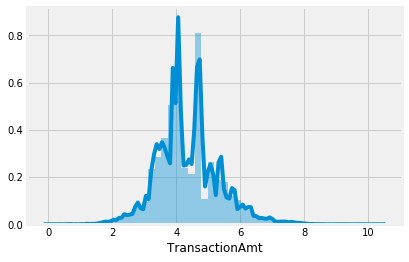

In [232]:
sns.distplot(np.log1p(df_full['TransactionAmt']))

In [233]:
df_full['TransactionAmt'] = np.log1p(df_full['TransactionAmt'])

In [242]:
feat = df_full.columns

In [243]:
[f for f in feat]

['TransactionDT',
 'TransactionAmt',
 'ProductCD',
 'card1',
 'card2',
 'card3',
 'card4',
 'card5',
 'card6',
 'addr1',
 'dist1',
 'dist2',
 'C3',
 'C5',
 'C9',
 'C13',
 'D1',
 'D3',
 'D5',
 'D8',
 'D9',
 'D10',
 'D11',
 'D12',
 'D13',
 'D14',
 'D15',
 'M1',
 'M2',
 'M3',
 'M4',
 'M5',
 'M6',
 'M7',
 'M8',
 'M9',
 'V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V12',
 'V13',
 'V15',
 'V17',
 'V19',
 'V20',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V29',
 'V31',
 'V35',
 'V36',
 'V37',
 'V38',
 'V39',
 'V40',
 'V42',
 'V44',
 'V45',
 'V46',
 'V47',
 'V48',
 'V51',
 'V53',
 'V54',
 'V55',
 'V56',
 'V59',
 'V61',
 'V62',
 'V64',
 'V66',
 'V67',
 'V68',
 'V69',
 'V73',
 'V75',
 'V76',
 'V77',
 'V78',
 'V79',
 'V80',
 'V82',
 'V83',
 'V85',
 'V86',
 'V87',
 'V90',
 'V98',
 'V100',
 'V104',
 'V105',
 'V109',
 'V114',
 'V115',
 'V116',
 'V123',
 'V124',
 'V125',
 'V129',
 'V130',
 'V131',
 'V135',
 'V136',
 'V137',
 'V138',
 'V139',
 'V140',
 'V141',
 'V142',
 'V144',
 'V146',
 'V147',
 'V148',
 'V152',
 'V157',
 'V161',
 'V162',
 'V165',
 'V166',
 'V169',
 'V170',
 'V171',
 'V172',
 'V173',
 'V174',
 'V175',
 'V176',
 'V180',
 'V181',
 'V183',
 'V184',
 'V185',
 'V186',
 'V187',
 'V188',
 'V189',
 'V190',
 'V191',
 'V194',
 'V195',
 'V197',
 'V198',
 'V200',
 'V201',
 'V203',
 'V205',
 'V207',
 'V208',
 'V209',
 'V210',
 'V214',
 'V215',
 'V216',
 'V218',
 'V220',
 'V221',
 'V223',
 'V224',
 'V226',
 'V227',
 'V228',
 'V229',
 'V230',
 'V234',
 'V235',
 'V238',
 'V239',
 'V242',
 'V243',
 'V245',
 'V246',
 'V247',
 'V248',
 'V250',
 'V252',
 'V255',
 'V257',
 'V258',
 'V259',
 'V260',
 'V261',
 'V262',
 'V264',
 'V267',
 'V268',
 'V270',
 'V271',
 'V274',
 'V281',
 'V282',
 'V283',
 'V284',
 'V285',
 'V286',
 'V287',
 'V288',
 'V289',
 'V290',
 'V291',
 'V297',
 'V300',
 'V301',
 'V302',
 'V303',
 'V309',
 'V310',
 'V312',
 'V313',
 'V314',
 'V315',
 'V319',
 'V320',
 'V321',
 'V325',
 'V335',
 'V336',
 'V337',
 'V338',
 'V339',
 'id_01',
 'id_02',
 'id_03',
 'id_04',
 'id_05',
 'id_06',
 'id_07',
 'id_08',
 'id_09',
 'id_10',
 'id_11',
 'id_12',
 'id_13',
 'id_14',
 'id_15',
 'id_16',
 'id_17',
 'id_18',
 'id_19',
 'id_20',
 'id_21',
 'id_22',
 'id_24',
 'id_25',
 'id_26',
 'id_28',
 'id_29',
 'id_32',
 'id_33',
 'id_34',
 'id_35',
 'id_36',
 'id_37',
 'id_38',
 'DeviceType',
 'DeviceInfo',
 'P_email',
 'P_domain',
 'R_email',
 'R_domain',
 'id_30_os',
 'id_30_os_version',
 'id_31_browser',
 'id_31_browser_version']

In [244]:
df_full.shape

(1097231, 272)

In [245]:
X_train.shape

(590540, 222)

In [246]:
X_test.shape

(506691, 221)

In [247]:
df_full.reset_index(drop=True, inplace=True)

In [248]:
X_train_new = df_full[feat].loc[:X_train.shape[0]-1]
X_train_new[target] = X_train[target]

In [249]:
X_test_new = df_full[feat].loc[X_train.shape[0]:]

In [250]:
X_train_new.to_csv(path + 'X_train.csv', index=None)
X_test_new.to_csv(path + 'X_test.csv', index=None)

# 7. Load processed data

In [256]:
#%%time

X_train = pd.read_csv(path + 'X_train.csv')
X_train = data_convert(
    df=X_train,
    col_exc=''
)

X_test = pd.read_csv(path + 'X_test.csv')
X_test = data_convert(
    df=X_test,
    col_exc=''
)

target = 'isFraud'

feat = ['TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6',
        'addr1', 'dist1', 'dist2', 'C3', 'C5', 'C9', 'C13', 'D1', 'D3', 'D5', 'D8', 'D9', 'D10', 'D11', 'D12',
        'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V2', 'V3', 'V4', 'V5', 'V6',
        'V7', 'V8', 'V9', 'V10', 'V12', 'V13', 'V15', 'V17', 'V19', 'V20', 'V23', 'V24', 'V25', 'V26', 'V27', 'V29',
        'V31', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V42', 'V44', 'V45', 'V46', 'V47', 'V48', 'V51', 'V53',
        'V54', 'V55', 'V56', 'V59', 'V61', 'V62', 'V64', 'V66', 'V67', 'V68', 'V69', 'V73', 'V75', 'V76', 'V77',
        'V78', 'V79', 'V80', 'V82', 'V83', 'V85', 'V86', 'V87', 'V90', 'V98', 'V100', 'V104', 'V105', 'V109',
        'V114', 'V115', 'V116', 'V123', 'V124', 'V125', 'V129', 'V130', 'V131', 'V135', 'V136', 'V137', 'V138',
        'V139', 'V140', 'V141', 'V142', 'V144', 'V146', 'V147', 'V148', 'V152', 'V157', 'V161', 'V162', 'V165',
        'V166', 'V169', 'V170', 'V171', 'V172', 'V173', 'V174', 'V175', 'V176', 'V180', 'V181', 'V183', 'V184',
        'V185', 'V186', 'V187', 'V188', 'V189', 'V190', 'V191', 'V194', 'V195', 'V197', 'V198', 'V200', 'V201',
        'V203', 'V205', 'V207', 'V208', 'V209', 'V210', 'V214', 'V215', 'V216', 'V218', 'V220', 'V221', 'V223',
        'V224', 'V226', 'V227', 'V228', 'V229', 'V230', 'V234', 'V235', 'V238', 'V239', 'V242', 'V243', 'V245',
        'V246', 'V247', 'V248', 'V250', 'V252', 'V255', 'V257', 'V258', 'V259', 'V260', 'V261', 'V262', 'V264',
        'V267', 'V268', 'V270', 'V271', 'V274', 'V281', 'V282', 'V283', 'V284', 'V285', 'V286', 'V287', 'V288',
        'V289', 'V290', 'V291', 'V297', 'V300', 'V301', 'V302', 'V303', 'V309', 'V310', 'V312', 'V313', 'V314',
        'V315', 'V319', 'V320', 'V321', 'V325', 'V335', 'V336', 'V337', 'V338', 'V339', 'id_01', 'id_02',
        'id_03', 'id_04', 'id_05', 'id_06', 'id_07', 'id_08', 'id_09', 'id_10', 'id_11', 'id_12', 'id_13',
        'id_14', 'id_15', 'id_16', 'id_17', 'id_18', 'id_19', 'id_20', 'id_21', 'id_22', 'id_24', 'id_25',
        'id_26', 'id_28', 'id_29', 'id_32', 'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38', 'DeviceType',
        'DeviceInfo', 'P_email', 'P_domain', 'R_email', 'R_domain', 'id_30_os', 'id_30_os_version', 'id_31_browser',
        'id_31_browser_version']
print(len(feat))
cat_feat = ['ProductCD', 'card4', 'card6', 'P_email', 'P_domain', 'R_email', 'R_domain', 'M1', 'M2', 'M3', 'M4',
            'M5', 'M6', 'M7', 'M8', 'M9', 'id_12', 'id_15', 'id_16', 'id_27', 'id_28', 'id_29', 'id_30_os',
            'id_30_os_version', 'id_31_browser', 'id_31_browser_version', 'id_33', 'id_34', 'id_35', 'id_36', 'id_37',
            'id_38', 'DeviceType', 'DeviceInfo']

y_train = X_train[target]
y_test_fake = np.ones(X_test.shape[0])
#for roc auc score
y_test_fake[0] = 0

X_train_r, X_test_r, y_train_r, y_test_r = train_test_split(
    X_train[feat],
    y_train,
    test_size=.25,
    random_state=random_state,
    stratify=y_train
)

#balance = y_train_r[y_train_r==0].shape[0]/y_train_r[y_train_r==1].shape[0]

gc.collect()

TransactionDT with type int64 converted to uint32
TransactionAmt with type float64 converted to float32
ProductCD with type int64 converted to uint8
card1 with type int64 converted to uint16
card2 with type float64 converted to float32
card3 with type float64 converted to float32
card4 with type int64 converted to int16
card5 with type float64 converted to float32
card6 with type int64 converted to int16
addr1 with type float64 converted to float32
dist1 with type float64 converted to float32
dist2 with type float64 converted to float32
C3 with type float64 converted to float32
C5 with type float64 converted to float32
C9 with type float64 converted to float32
C13 with type float64 converted to float32
D1 with type float64 converted to float32
D3 with type float64 converted to float32
D5 with type float64 converted to float32
D8 with type float64 converted to float32
D9 with type float64 converted to float32
D10 with type float64 converted to float32
D11 with type float64 converted to 

V124 with type float64 converted to float32
V125 with type float64 converted to float32
V129 with type float64 converted to float32
V130 with type float64 converted to float32
V131 with type float64 converted to float32
V135 with type float64 converted to float32
V136 with type float64 converted to float32
V137 with type float64 converted to float32
V138 with type float64 converted to float32
V139 with type float64 converted to float32
V140 with type float64 converted to float32
V141 with type float64 converted to float32
V142 with type float64 converted to float32
V144 with type float64 converted to float32
V146 with type float64 converted to float32
V147 with type float64 converted to float32
V148 with type float64 converted to float32
V152 with type float64 converted to float32
V157 with type float64 converted to float32
V161 with type float64 converted to float32
V162 with type float64 converted to float32
V165 with type float64 converted to float32
V166 with type float64 converted

824

In [270]:
cat_feat = ['ProductCD', 'card4', 'card6', 'P_email', 'P_domain', 'R_email', 'R_domain', 'M1',
       'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'id_12', 'id_15',
       'id_16', 'id_28', 'id_29', 'id_33',
       'id_34', 'id_35', 'id_36', 'id_37', 'id_38', 'DeviceType',
       'DeviceInfo']

In [258]:
X_train.fillna(0, inplace=True)

In [259]:
X_test.fillna(0, inplace=True)

# 13. Catboost

## 13.0 Catboost datasets

In [271]:
X_train_ctbst, X_test_ctbst, y_train_ctbst, y_test_ctbst = train_test_split(
    X_train[feat],
    y_train,
    test_size=.1,
    random_state=random_state,
    stratify=y_train
)

X_test_ctbst = X_test_ctbst[feat]

X_train_ctbst, X_eval_ctbst, y_train_ctbst, y_eval_ctbst = train_test_split(
    X_train_ctbst,
    y_train_ctbst,
    test_size=.25,
    random_state=random_state,
    stratify=y_train_ctbst
)

train_ctbst_full = ctbst.Pool(
    data=X_train[feat],
    label=y_train,
    cat_features=cat_feat,
    column_description=None,
    pairs=None,
    delimiter='\t',
    has_header=True,
    weight=None,
    group_id=None,
    group_weight=None,
    subgroup_id=None,
    pairs_weight=None,
    baseline=None,
    feature_names=feat,
    thread_count=n_threads
)

train_ctbst = ctbst.Pool(
    data=X_train_ctbst,
    label=y_train_ctbst,
    cat_features=cat_feat,
    column_description=None,
    pairs=None,
    delimiter='\t',
    has_header=True,
    weight=None,
    group_id=None,
    group_weight=None,
    subgroup_id=None,
    pairs_weight=None,
    baseline=None,
    feature_names=feat,
    thread_count=n_threads
)

eval_ctbst = ctbst.Pool(
    data=X_eval_ctbst,
    label=y_eval_ctbst,
    cat_features=cat_feat,
    column_description=None,
    pairs=None,
    delimiter='\t',
    has_header=True,
    weight=None,
    group_id=None,
    group_weight=None,
    subgroup_id=None,
    pairs_weight=None,
    baseline=None,
    feature_names=feat,
    thread_count=n_threads
)

test_ctbst = ctbst.Pool(
    data=X_test_ctbst,
    label=y_test_ctbst,
    cat_features=cat_feat,
    column_description=None,
    pairs=None,
    delimiter='\t',
    has_header=True,
    weight=None,
    group_id=None,
    group_weight=None,
    subgroup_id=None,
    pairs_weight=None,
    baseline=None,
    feature_names=feat,
    thread_count=n_threads
)

balance = y_train_ctbst[y_train_ctbst==0].shape[0]/y_train_ctbst[y_train_ctbst==1].shape[0]

## 13.1 Finding the best one_hot_max_size and depth

In [274]:
#%%time

train_results = []
valid_results = []

ohmss = range(10, 250, 10)

for ohms in tqdm_notebook(ohmss):
    
    model = ctbst.CatBoostClassifier(
        iterations=10,
        learning_rate=1,
        depth=5,
        l2_leaf_reg=3,
        model_size_reg=.5,
        #rsm=.75, #CPU
        loss_function='Logloss',
        border_count=254,
        feature_border_type='GreedyLogSum',
        input_borders=None,
        output_borders=None,
        fold_permutation_block=None,
        #od_pval=.01, #IncToDec
        od_wait=20,
        od_type='Iter',
        nan_mode='Min',
        counter_calc_method='Full',
        leaf_estimation_iterations=100,
        leaf_estimation_method='Gradient',
        thread_count=n_threads,
        random_seed=random_state,
        #use_best_model=True, #set in train
        best_model_min_trees=None,
        verbose=0,
        #silent=None,
        #logging_level='Silent',
        metric_period=1,
        ctr_leaf_count_limit=None,
        store_all_simple_ctr=False,
        max_ctr_complexity=4,
        has_time=False,
        allow_const_label=False,
        #classes_count=None, #Multiclassification
        #class_weights=1,
        class_names=None,
        one_hot_max_size=ohms,
        random_strength=1,
        name='experiment',
        ignored_features=None,
        train_dir='catboost_info',
        custom_loss=None,
        custom_metric=None,
        eval_metric='AUC',
        bagging_temperature=1,
        save_snapshot=False,
        snapshot_file='experiment.cbsnapshot',
        #snapshot_interval=600,
        fold_len_multiplier=2,
        used_ram_limit=None,
        gpu_ram_part=.95, #GPU
        #pinned_memory_size=1073741824, #GPU
        allow_writing_files=True,
        final_ctr_computation_mode='Default',
        approx_on_full_history=False,
        boosting_type='Ordered', #GPU
        #simple_ctr='Borders',
        #combinations_ctr='Borders',
        #per_feature_ctr='Borsers',
        ctr_description=None,
        ctr_target_border_count=None,
        task_type='CPU',
        device_config=None,
        devices='0',
        bootstrap_type='Bayesian',
        #subsample=.66, #Poison or Bernulli
        sampling_unit=None,
        dev_score_calc_obj_block_size=None,
        dev_efb_max_buckets=None,
        efb_max_conflict_fraction=None,
        #max_depth=None, #depth
        #n_estimators=None, #iterations
        #num_boost_round=None, #iterations
        #num_trees=None, #iterations
        #colsample_bylevel=None, #rsm
        #random_state=random_state, #random_seed
        #reg_lambda=None, #l2_leaf_reg
        #objective=None, #loss_function
        #eta=None, #learning_rate
        #max_bin=None, #border_count
        scale_pos_weight=balance,
        #gpu_cat_features_storage='GpuRam', #GPU
        #data_partition='FeatureParallel', #GPU
        metadata=None,
        #early_stopping_rounds=3000, #set in train
        #cat_features=cat_feat, #set in train
        #grow_policy='SymmetricTree', #GPU
        min_data_in_leaf=1,
        #max_leaves=31, #lossguide
        #score_function='Correlation', #GPU
        leaf_estimation_backtracking='AnyImprovement',
        ctr_history_unit=None
    )

    model.fit(
        X=train_ctbst,
        #y=None, #for not Pool
        #cat_features=cat_feat, #for not Pool
        #sample_weight=None, #for not Pool
        baseline=None,
        use_best_model=True,
        eval_set=[eval_ctbst], #[train_ctbst, eval_ctbst] #CPU
        #verbose=True,
        logging_level=None,
        plot=False,
        column_description=None,
        verbose_eval=None,
        metric_period=None,
        silent=None,
        early_stopping_rounds=3000,
        save_snapshot=None,
        snapshot_file=None,
        snapshot_interval=None
    )

    y_pred_train = model.predict(
        data=train_ctbst,
        prediction_type='Probability',
        ntree_start=0,
        ntree_end=model.best_iteration_,
        thread_count=n_threads,
        verbose=None
    )

    y_pred_train = y_pred_train[:, 1]
    
    y_pred_test = model.predict(
        data=test_ctbst,
        prediction_type='Probability',
        ntree_start=0,
        ntree_end=model.best_iteration_,
        thread_count=n_threads,
        verbose=None
    )
    
    y_pred_test = y_pred_test[:, 1]
    
    train_results.append(roc_auc_score(train_ctbst.get_label(), y_pred_train))
    valid_results.append(roc_auc_score(test_ctbst.get_label(), y_pred_test))
    
plot_vc(
    x=[ohms for d in ohmss],
    y_train=train_results,
    y_valid=valid_results,
    xlabel='ohe_hot_max_size'
)

KeyboardInterrupt: 

In [7]:
#%%time

train_results = []
valid_results = []

depths = range(1, 9, 1)

for d in tqdm_notebook(depths):
    
    model = ctbst.CatBoostClassifier(
        iterations=10,
        learning_rate=.1,
        depth=d,
        l2_leaf_reg=3,
        model_size_reg=.5,
        #rsm=.75, #CPU
        loss_function='Logloss',
        border_count=254,
        feature_border_type='GreedyLogSum',
        input_borders=None,
        output_borders=None,
        fold_permutation_block=None,
        #od_pval=.01, #IncToDec
        od_wait=20,
        od_type='Iter',
        nan_mode='Min',
        counter_calc_method='Full',
        leaf_estimation_iterations=100,
        leaf_estimation_method='Gradient',
        thread_count=n_threads,
        random_seed=random_state,
        #use_best_model=True, #set in train
        best_model_min_trees=None,
        verbose=0,
        #silent=None,
        #logging_level='Silent',
        metric_period=1,
        ctr_leaf_count_limit=None,
        store_all_simple_ctr=False,
        max_ctr_complexity=4,
        has_time=False,
        allow_const_label=False,
        #classes_count=None, #Multiclassification
        #class_weights=1,
        class_names=None,
        one_hot_max_size=3,
        random_strength=1,
        name='experiment',
        ignored_features=None,
        train_dir='catboost_info',
        custom_loss=None,
        custom_metric=None,
        eval_metric='AUC',
        bagging_temperature=1,
        save_snapshot=False,
        snapshot_file='experiment.cbsnapshot',
        #snapshot_interval=600,
        fold_len_multiplier=2,
        used_ram_limit=None,
        gpu_ram_part=.95, #GPU
        #pinned_memory_size=1073741824, #GPU
        allow_writing_files=True,
        final_ctr_computation_mode='Default',
        approx_on_full_history=False,
        boosting_type='Ordered', #GPU
        #simple_ctr='Borders',
        #combinations_ctr='Borders',
        #per_feature_ctr='Borsers',
        ctr_description=None,
        ctr_target_border_count=None,
        task_type='GPU',
        device_config=None,
        devices='0',
        bootstrap_type='Bayesian',
        #subsample=.66, #Poison or Bernulli
        sampling_unit=None,
        dev_score_calc_obj_block_size=None,
        dev_efb_max_buckets=None,
        efb_max_conflict_fraction=None,
        #max_depth=None, #depth
        #n_estimators=None, #iterations
        #num_boost_round=None, #iterations
        #num_trees=None, #iterations
        #colsample_bylevel=None, #rsm
        #random_state=random_state, #random_seed
        #reg_lambda=None, #l2_leaf_reg
        #objective=None, #loss_function
        #eta=None, #learning_rate
        #max_bin=None, #border_count
        scale_pos_weight=balance,
        gpu_cat_features_storage='GpuRam', #GPU
        data_partition='FeatureParallel', #GPU
        metadata=None,
        #early_stopping_rounds=3000, #set in train
        #cat_features=cat_feat, #set in train
        grow_policy='SymmetricTree', #GPU
        min_data_in_leaf=1,
        #max_leaves=31, #lossguide
        score_function='Correlation', #GPU
        leaf_estimation_backtracking='AnyImprovement',
        ctr_history_unit=None
    )

    model.fit(
        X=train_ctbst,
        #y=None, #for not Pool
        #cat_features=cat_feat, #for not Pool
        #sample_weight=None, #for not Pool
        baseline=None,
        use_best_model=True,
        eval_set=[eval_ctbst], #[train_ctbst, eval_ctbst] #CPU
        #verbose=True,
        logging_level=None,
        plot=False,
        column_description=None,
        verbose_eval=None,
        metric_period=None,
        silent=None,
        early_stopping_rounds=3000,
        save_snapshot=None,
        snapshot_file=None,
        snapshot_interval=None
    )

    y_pred_train = model.predict(
        data=train_ctbst,
        prediction_type='Probability',
        ntree_start=0,
        ntree_end=model.best_iteration_,
        thread_count=n_threads,
        verbose=None
    )

    y_pred_train = y_pred_train[:, 1]
    
    y_pred_test = model.predict(
        data=test_ctbst,
        prediction_type='Probability',
        ntree_start=0,
        ntree_end=model.best_iteration_,
        thread_count=n_threads,
        verbose=None
    )
    
    y_pred_test = y_pred_test[:, 1]
    
    train_results.append(roc_auc_score(train_ctbst.get_label(), y_pred_train))
    valid_results.append(roc_auc_score(test_ctbst.get_label(), y_pred_test))
    
plot_vc(
    x=[d for d in depths],
    y_train=train_results,
    y_valid=valid_results,
    xlabel='DEPTH'
)

## 13.2 Model with all features

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.8630643	test: 0.4261084	best: 0.4261084 (0)	total: 386ms	remaining: 3.47s
9:	learn: 0.9997982	test: 0.5011196	best: 0.5011196 (9)	total: 3.45s	remaining: 0us
bestTest = 0.501119554
bestIteration = 9
Shrink model to first 10 iterations.

 ROC AUC score: 0.7144444444444444


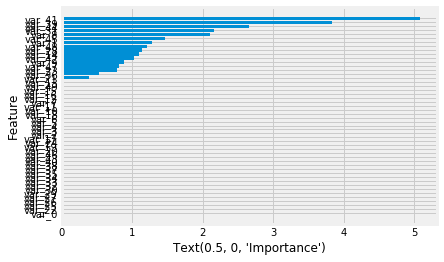

In [41]:
#%%time

params_cpu = {
#Common parameters
    'loss_function': 'Logloss',
    #'custom_metric': None,
    'eval_metric': 'AUC',
    'iterations': 10,
    'learning_rate': .1,
    'random_seed': random_state,
    'l2_leaf_reg': 3,
    'bootstrap_type': 'Bayesian',
    'bagging_temperature': 1,
    #'subsample': .66, #Poison or Bernulli
    'sampling_frequency': 'PerTreeLevel', #CPU
    'random_strength': 1,
    'use_best_model': True,
    #'best_model_min_trees': None, #set in train
    'depth': 8,
    'ignored_features': [],
    'one_hot_max_size': 2,
    'has_time': False,
    'rsm': .75, #CPU
    'nan_mode': 'Min',
    #'fold_permutation_block_size': 1,
    'leaf_estimation_iterations': 100,
    'leaf_estimation_method': 'Gradient',
    'fold_len_multiplier': 2,
    'approx_on_full_history': False,
    #'class_weights': 1, #LogLoss
    'scale_pos_weight': balance, #LogLoss
    #'boosting_type': 'Ordered', #GPU
    'allow_const_label': False,
#Overfitting detection settings
    'od_type': 'Iter',
    #'od_pval': .01, #IncToDec
    'od_wait': 20,
    #'early_stopping_rounds': True,
#Binarization settings
    'border_count': 254,
    'feature_border_type': 'GreedyLogSum',
#Multiclassification settings
    #'classes_count': None, #Multiclassification
#Performance settings
    'thread_count': n_threads,
    'used_ram_limit': None,
    'gpu_ram_part': .95, #GPU
    'pinned_memory_size': 1073741824, #GPU
    'gpu_cat_features_storage': 'GpuRam', #GPU
    'data_partition': 'FeatureParallel', #GPU
#Processing unit settings
    'task_type': 'CPU',
    'devices': '0',
#Visualization settings
    'name': 'experiment',
#Output settings
    'logging_level': 'Silent',
    'metric_period': 1,
    #'verbose': 1,
    'train_dir': 'catboost_info',
    'model_size_reg': .5,
    'allow_writing_files': True,
    'save_snapshot': False,
    'snapshot_file': 'experiment.cbsnapshot',
    #'snapshot_interval': 600,
    #'roc_file': None,
#CTR settings
    #'simple_ctr': 'Borders',
    #'combinations_ctr': 'Borders',
    #'per_feature_ctr': 'Borsers',
    'counter_calc_method': 'Full',
    'max_ctr_complexity': 4,
    #'ctr_leaf_count_limit': None,
    'store_all_simple_ctr': False,
    'final_ctr_computation_mode': 'Default'
}

params_gpu = {
#Common parameters
    'loss_function': 'Logloss',
    #'custom_metric': None,
    'eval_metric': 'AUC',
    'iterations': 10,
    'learning_rate': .1,
    'random_seed': random_state,
    'l2_leaf_reg': 3,
    'bootstrap_type': 'Bayesian',
    'bagging_temperature': 1,
    #'subsample': .66, #Poison or Bernulli
    #'sampling_frequency': 'PerTreeLevel', #CPU
    'random_strength': 1,
    'use_best_model': True,
    #'best_model_min_trees': None, #set in train
    'depth': 8,
    'ignored_features': [],
    'one_hot_max_size': 2,
    'has_time': False,
    #'rsm': .75, #CPU
    'nan_mode': 'Min',
    #'fold_permutation_block_size': 1,
    'leaf_estimation_iterations': 100,
    'leaf_estimation_method': 'Gradient',
    'fold_len_multiplier': 2,
    'approx_on_full_history': False,
    #'class_weights': 1, #LogLoss
    'scale_pos_weight': balance, #LogLoss
    'boosting_type': 'Ordered', #GPU
    'allow_const_label': False,
#Overfitting detection settings
    'od_type': 'Iter',
    #'od_pval': .01, #IncToDec
    'od_wait': 20,
    #'early_stopping_rounds': True,
#Binarization settings
    'border_count': 254,
    'feature_border_type': 'GreedyLogSum',
#Multiclassification settings
    #'classes_count': None, #Multiclassification
#Performance settings
    'thread_count': n_threads,
    'used_ram_limit': None,
    'gpu_ram_part': .95, #GPU
    #'pinned_memory_size': 1073741824, #GPU
    'gpu_cat_features_storage': 'GpuRam', #GPU
    'data_partition': 'FeatureParallel', #GPU
#Processing unit settings
    'task_type': 'GPU',
    'devices': '0',
#Visualization settings
    'name': 'experiment',
#Output settings
    'logging_level': 'Silent',
    'metric_period': 1,
    #'verbose': 1,
    'train_dir': 'catboost_info',
    'model_size_reg': .5,
    'allow_writing_files': True,
    'save_snapshot': False,
    'snapshot_file': 'experiment.cbsnapshot',
    #'snapshot_interval': 600,
    #'roc_file': None,
#CTR settings
    #'simple_ctr': 'Borders',
    #'combinations_ctr': 'Borders',
    #'per_feature_ctr': 'Borsers',
    'counter_calc_method': 'Full',
    'max_ctr_complexity': 4,
    #'ctr_leaf_count_limit': None,
    'store_all_simple_ctr': False,
    'final_ctr_computation_mode': 'Default'
}

#model = ctbst.CatBoost(
#    params=params_cpu
#)

#model.fit(
#    X=train_ctbst,
#    #y=y_train_ctbst, #for not pool dataset
#    #cat_features=cat_feat, #fot not pool dataset
#    pairs=None,
#    #sample_weight=None, #fot not pool dataset
#    #group_id=None, #fot not pool dataset
#    #group_weight=None, #fot not pool dataset
#    #subgroup_id=None, #fot not pool dataset
#    #pairs_weight=None, #fot not pool dataset
#    #baseline=None,
#    use_best_model=True,
#    eval_set=eval_ctbst,
#    #verbose=True,
#    #logging_level='Verbose',
#    plot=True,
#    column_description=None,
#    verbose_eval=False, #500
#    metric_period=None,
#    #silent=False, #verbose eval is set
#    early_stopping_rounds=100
#)

model = ctbst.train(
    #dtrain
    pool=train_ctbst,
    params=params_gpu,
    logging_level=None,
    #verbose_eval
    verbose=1000,
    #num_boost_round=None, #get from params
    #iterations=None=None, #get from params
    #evals
    eval_set=[eval_ctbst], #[train_ctbst, eval_ctbst], #CPU
    plot=True,
    metric_period=None,
    early_stopping_rounds=3000,
    save_snapshot=None,
    snapshot_file=None,
    snapshot_interval=None
)

y_pred = model.predict(
    data=test_ctbst,
    prediction_type='Probability',
    ntree_start=0,
    ntree_end=model.best_iteration_,
    thread_count=n_threads,
    verbose=None
)

y_pred = y_pred[:, 1]

print(
    '\n',
    'ROC AUC score:',
    roc_auc_score(test_ctbst.get_label(), y_pred),
)

plot_feat_imp(
    feat=feat,
    imp=model.get_feature_importance(),
    n_feat=50
)

model.save_model(
    fname='model_ctbst',
    format='cbm',
    export_parameters=None
)

In [24]:
ctbst.cv(
    #dtrain
    pool=train_ctbst_full,
    params=params_gpu,
    #num_boost_round=None, #get from params
    #iterations=None=None, #get from params
    #nfold
    fold_count=5,
    inverted=False,
    #seed
    partition_random_seed=random_state,
    shuffle=True,
    logging_level=None,
    stratified=False,
    as_pandas=True,
    metric_period=None,
    #verbose_eval
    plot=True,
    early_stopping_rounds=3000,
    save_snapshot=None,
    snapshot_file=None,
    snapshot_interval=None,
    max_time_spent_on_fixed_cost_ratio=0.05,
    dev_max_iterations_batch_size=100000
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

,iterations,test-AUC-mean,test-AUC-std,test-Logloss-mean,test-Logloss-std,train-Logloss-mean,train-Logloss-std
0,0,0.513577,0.054229,0.699566,0.014386,0.637566,0.008274
1,1,0.509586,0.081776,0.712561,0.023867,0.584072,0.012662
2,2,0.480483,0.059016,0.732778,0.025161,0.530857,0.022888
3,3,0.505062,0.071259,0.744294,0.033525,0.486684,0.021431
4,4,0.518308,0.049445,0.749758,0.027311,0.455386,0.022310
5,5,0.531975,0.046272,0.754755,0.018800,0.426378,0.014654
6,6,0.531939,0.045099,0.776275,0.030100,0.391288,0.016696
7,7,0.521761,0.050296,0.797772,0.038199,0.365379,0.016136
8,8,0.532784,0.052111,0.808674,0.034264,0.341898,0.016306
9,9,0.545603,0.046690,0.816460,0.031661,0.320289,0.020068


## 13.3 Finding the best params

In [45]:
model = ctbst.CatBoostClassifier(
    iterations=1000,
    learning_rate=1,
    depth=6,
    l2_leaf_reg=3,
    model_size_reg=.5,
    #rsm=.75, #CPU
    loss_function='Logloss',
    border_count=254,
    feature_border_type='GreedyLogSum',
    input_borders=None,
    output_borders=None,
    fold_permutation_block=None,
    #od_pval=.01, #IncToDec
    od_wait=20,
    od_type='Iter',
    nan_mode='Min',
    counter_calc_method='Full',
    leaf_estimation_iterations=100,
    leaf_estimation_method='Gradient',
    thread_count=n_threads,
    random_seed=random_state,
    #use_best_model=True, #set in train
    best_model_min_trees=None,
    verbose=0,
    #silent=None,
    #logging_level='Silent',
    metric_period=1,
    ctr_leaf_count_limit=None,
    store_all_simple_ctr=False,
    max_ctr_complexity=4,
    has_time=False,
    allow_const_label=False,
    #classes_count=None, #Multiclassification
    #class_weights=1,
    class_names=None,
    one_hot_max_size=3,
    random_strength=1,
    name='experiment',
    ignored_features=None,
    train_dir='catboost_info',
    custom_loss=None,
    custom_metric=None,
    eval_metric='AUC',
    bagging_temperature=1,
    save_snapshot=False,
    snapshot_file='experiment.cbsnapshot',
    #snapshot_interval=600,
    fold_len_multiplier=2,
    used_ram_limit=None,
    gpu_ram_part=.95, #GPU
    #pinned_memory_size=1073741824, #GPU
    allow_writing_files=True,
    final_ctr_computation_mode='Default',
    approx_on_full_history=False,
    #boosting_type='Ordered', #GPU
    #simple_ctr='Borders',
    #combinations_ctr='Borders',
    #per_feature_ctr='Borsers',
    ctr_description=None,
    ctr_target_border_count=None,
    task_type='CPU',
    device_config=None,
    devices='0',
    bootstrap_type='Bayesian',
    #subsample=.66, #Poison or Bernulli
    sampling_unit=None,
    dev_score_calc_obj_block_size=None,
    dev_efb_max_buckets=None,
    efb_max_conflict_fraction=None,
    #max_depth=None, #depth
    #n_estimators=None, #iterations
    #num_boost_round=None, #iterations
    #num_trees=None, #iterations
    #colsample_bylevel=None, #rsm
    #random_state=random_state, #random_seed
    #reg_lambda=None, #l2_leaf_reg
    #objective=None, #loss_function
    #eta=None, #learning_rate
    #max_bin=None, #border_count
    scale_pos_weight=balance,
    #gpu_cat_features_storage='GpuRam', #GPU
    #data_partition='FeatureParallel', #GPU
    metadata=None,
    #early_stopping_rounds=3000, #set in train
    #cat_features=cat_feat, #set in train
    #grow_policy='SymmetricTree', #GPU
    min_data_in_leaf=1,
    #max_leaves=31, #lossguide
    #score_function='Correlation', #GPU
    leaf_estimation_backtracking='AnyImprovement',
    ctr_history_unit=None
)

param_grid = {
    'iterations': [int(x) for x in np.linspace(start=1, stop=1, num=1)],
}

train_grid = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_grid,
    scoring='roc_auc',
    cv=3,
    n_jobs=n_threads,
    verbose=True
)

train_grid.fit(
    X=train_ctbst.get_features(),
    y=train_ctbst.get_label()
)

train_grid.fit(
    X=train_ctbst.get_features(),
    y=train_ctbst.get_label(),
    cat_features=cat_feat, #for not Pool
    sample_weight=None, #for not Pool
    baseline=None,
    use_best_model=True,
    eval_set=[(train_ctbst.get_features(), train_ctbst.get_label()), (eval_ctbst.get_features(), eval_ctbst.get_label())],
    #verbose=True,
    logging_level=None,
    plot=False,
    column_description=None,
    verbose_eval=None,
    metric_period=None,
    silent=None,
    early_stopping_rounds=3,
    save_snapshot=None,
    snapshot_file=None,
    snapshot_interval=None
)

y_pred = train_grid.best_estimator_.predict_proba(
    data=test_ctbst,
    ntree_start=0,
    ntree_end=train_grid.best_estimator_.best_iteration_,
    thread_count=n_threads,
    verbose=None
)

y_pred = y_pred[:, 1]

print(
    '\n',
    'ROC AUC:',
    roc_auc_score(test_ctbst.get_label(), y_pred)
)

print(train_grid.best_params_)


 ROC AUC: 0.5399999999999999
{'iterations': 1}


## 13.4 Final model

In [11]:
def model_CTBST_C(X_train, X_valid, X_test, y_train, y_valid, y_test, feat, cat_feat, random_state):
    
    #X_train_lgb, X_valid_lgb, y_train_lgb, y_valid_lgb = \
    #    X_train.iloc[:int(X_train.shape[0]*.75)][feat], \
    #    X_train.iloc[int(X_train.shape[0]*.75):][feat], \
    #    y_train[:int(y_train.shape[0]*.75)], \
    #    y_train[int(y_train.shape[0]*.75):]
    
    X_train_ctbst, X_eval_ctbst, y_train_ctbst, y_eval_ctbst = train_test_split(
        X_train[feat],
        y_train,
        test_size=.25,
        random_state=random_state,
        stratify=y_train
    )
    
    train_ctbst = ctbst.Pool(
        data=X_train_ctbst,
        label=y_train_ctbst,
        cat_features=cat_feat,
        column_description=None,
        pairs=None,
        delimiter='\t',
        has_header=True,
        weight=None,
        group_id=None,
        group_weight=None,
        subgroup_id=None,
        pairs_weight=None,
        baseline=None,
        feature_names=feat,
        thread_count=n_threads
    )

    eval_ctbst = ctbst.Pool(
        data=X_eval_ctbst,
        label=y_eval_ctbst,
        cat_features=cat_feat,
        column_description=None,
        pairs=None,
        delimiter='\t',
        has_header=True,
        weight=None,
        group_id=None,
        group_weight=None,
        subgroup_id=None,
        pairs_weight=None,
        baseline=None,
        feature_names=feat,
        thread_count=n_threads
    )
    
    valid_ctbst = ctbst.Pool(
        data=X_valid[feat],
        label=y_valid,
        cat_features=cat_feat,
        column_description=None,
        pairs=None,
        delimiter='\t',
        has_header=True,
        weight=None,
        group_id=None,
        group_weight=None,
        subgroup_id=None,
        pairs_weight=None,
        baseline=None,
        feature_names=feat,
        thread_count=n_threads
    )

    test_ctbst = ctbst.Pool(
        data=X_test[feat],
        label=y_test,
        cat_features=cat_feat,
        column_description=None,
        pairs=None,
        delimiter='\t',
        has_header=True,
        weight=None,
        group_id=None,
        group_weight=None,
        subgroup_id=None,
        pairs_weight=None,
        baseline=None,
        feature_names=feat,
        thread_count=n_threads
    )

    balance = y_train_ctbst[y_train_ctbst==0].shape[0]/y_train_ctbst[y_train_ctbst==1].shape[0]
    
    params = {
    #Common parameters
        'loss_function': 'Logloss',
        #'custom_metric': None,
        'eval_metric': 'AUC',
        'iterations': 10,
        'learning_rate': .1,
        'random_seed': random_state,
        'l2_leaf_reg': 3,
        'bootstrap_type': 'Bayesian',
        'bagging_temperature': 1,
        #'subsample': .66, #Poison or Bernulli
        #'sampling_frequency': 'PerTreeLevel', #CPU
        'random_strength': 1,
        'use_best_model': True,
        #'best_model_min_trees': None, #set in train
        'depth': 8,
        'ignored_features': [],
        'one_hot_max_size': 2,
        'has_time': False,
        #'rsm': .75, #CPU
        'nan_mode': 'Min',
        #'fold_permutation_block_size': 1,
        'leaf_estimation_iterations': 100,
        'leaf_estimation_method': 'Gradient',
        'fold_len_multiplier': 2,
        'approx_on_full_history': False,
        #'class_weights': 1, #LogLoss
        'scale_pos_weight': balance, #LogLoss
        'boosting_type': 'Ordered', #GPU
        'allow_const_label': False,
    #Overfitting detection settings
        'od_type': 'Iter',
        #'od_pval': .01, #IncToDec
        'od_wait': 20,
        #'early_stopping_rounds': True,
    #Binarization settings
        'border_count': 254,
        'feature_border_type': 'GreedyLogSum',
    #Multiclassification settings
        #'classes_count': None, #Multiclassification
    #Performance settings
        'thread_count': n_threads,
        'used_ram_limit': None,
        'gpu_ram_part': .95, #GPU
        #'pinned_memory_size': 1073741824, #GPU
        'gpu_cat_features_storage': 'GpuRam', #GPU
        'data_partition': 'FeatureParallel', #GPU
    #Processing unit settings
        'task_type': 'GPU',
        'devices': '0',
    #Visualization settings
        'name': 'experiment',
    #Output settings
        'logging_level': 'Silent',
        'metric_period': 1,
        #'verbose': 1,
        'train_dir': 'catboost_info',
        'model_size_reg': .5,
        'allow_writing_files': True,
        'save_snapshot': False,
        'snapshot_file': 'experiment.cbsnapshot',
        #'snapshot_interval': 600,
        #'roc_file': None,
    #CTR settings
        #'simple_ctr': 'Borders',
        #'combinations_ctr': 'Borders',
        #'per_feature_ctr': 'Borsers',
        'counter_calc_method': 'Full',
        'max_ctr_complexity': 4,
        #'ctr_leaf_count_limit': None,
        'store_all_simple_ctr': False,
        'final_ctr_computation_mode': 'Default'
    }

    #model = ctbst.CatBoost(
    #    params=params_cpu
    #)

    #model.fit(
    #    X=train_ctbst,
    #    #y=y_train_ctbst, #for not pool dataset
    #    #cat_features=cat_feat, #fot not pool dataset
    #    pairs=None,
    #    #sample_weight=None, #fot not pool dataset
    #    #group_id=None, #fot not pool dataset
    #    #group_weight=None, #fot not pool dataset
    #    #subgroup_id=None, #fot not pool dataset
    #    #pairs_weight=None, #fot not pool dataset
    #    #baseline=None,
    #    use_best_model=True,
    #    eval_set=eval_ctbst,
    #    #verbose=True,
    #    #logging_level='Verbose',
    #    plot=True,
    #    column_description=None,
    #    verbose_eval=False, #500
    #    metric_period=None,
    #    #silent=False, #verbose eval is set
    #    early_stopping_rounds=100
    #)

    model = ctbst.train(
        #dtrain
        pool=train_ctbst,
        params=params,
        logging_level=None,
        #verbose_eval
        verbose=1000,
        #num_boost_round=None, #get from params
        #iterations=None=None, #get from params
        #evals
        eval_set=[eval_ctbst], #[train_ctbst, eval_ctbst], #CPU
        plot=False,
        metric_period=None,
        early_stopping_rounds=3,
        save_snapshot=None,
        snapshot_file=None,
        snapshot_interval=None
    )
    
    if X_valid.shape[0] > 0 and y_valid.shape[0] > 0:
        
        y_valid_pred = model.predict(
            data=valid_ctbst,
            prediction_type='Probability',
            ntree_start=0,
            ntree_end=model.best_iteration_,
            thread_count=n_threads,
            verbose=None
        )

        y_valid_pred = y_valid_pred[:, 1]

        print(
            'MODEL LGBM',
            '\nROC AUC valid score:',
            roc_auc_score(valid_ctbst.get_label(), y_valid_pred)
        )
        
    else:
        
        y_valid_pred = np.nan
        
    y_test_pred = model.predict(
        data=test_ctbst,
        prediction_type='Probability',
        ntree_start=0,
        ntree_end=model.best_iteration_,
        thread_count=n_threads,
        verbose=None
    )

    y_test_pred = y_test_pred[:, 1]

    print(
        'MODEL CTBST',
        '\nROC_AUC:',
        roc_auc_score(test_ctbst.get_label(), y_test_pred)
    )

    return y_valid_pred, y_test_pred

In [26]:
oof = np.zeros(X_train.shape[0])
preds = np.zeros(X_test.shape[0])

for f, (train_ind, valid_ind) in enumerate(folds.split(X_train, y_train)):
    
    print('\nfold {}'.format(f))
    
    X_train_f, X_valid_f = X_train[feat].iloc[train_ind], X_train[feat].iloc[valid_ind]
    y_train_f, y_valid_f = y_train.iloc[train_ind], y_train.iloc[valid_ind]

    oof[valid_ind], pred = model_mean(
        model=model_CTBST_C,
        X_train=X_train_f,
        X_valid=X_valid_f,
        X_test=X_test,
        y_train=y_train_f,
        y_valid=y_valid_f,
        y_test=y_test_fake,
        feat=feat,
        cat_feat=cat_feat,
        random_state=random_state,
        samples=1,
        info='LGBM C DART'
    )
    
    preds += pred / n_folds
    
oof_ctbst_c = oof
pred_ctbst_c = preds


fold 0
0:	learn: 0.8912393	test: 0.4554167	best: 0.4554167 (0)	total: 355ms	remaining: 3.2s
bestTest = 0.4554166645
bestIteration = 0
Shrink model to first 1 iterations.
MODEL LGBM 
ROC AUC valid score: 0.43704565280604823
MODEL CTBST 
ROC_AUC: 0.8618618618618619
1 LGBM C DART MODELS 
ROC_AUC va;od score: 0.43704565280604823
1 LGBM C DART MODELS 
ROC_AUC test score: 0.8618618618618619

fold 1
0:	learn: 0.8557408	test: 0.3972222	best: 0.3972222 (0)	total: 337ms	remaining: 3.03s
9:	learn: 1.0000000	test: 0.5550000	best: 0.5680556 (8)	total: 3.38s	remaining: 0us
bestTest = 0.5680555701
bestIteration = 8
Shrink model to first 9 iterations.
MODEL LGBM 
ROC AUC valid score: 0.518161362905818
MODEL CTBST 
ROC_AUC: 0.14814814814814814
1 LGBM C DART MODELS 
ROC_AUC va;od score: 0.518161362905818
1 LGBM C DART MODELS 
ROC_AUC test score: 0.14814814814814814

fold 2
0:	learn: 0.9447706	test: 0.6254725	best: 0.6254725 (0)	total: 346ms	remaining: 3.11s
bestTest = 0.6455364823
bestIteration = 3
Shr

# 16. Stacking

In [27]:
X_train['pred_rfc'] = oof_rfc
X_train['pred_etc'] = oof_etc
X_train['pred_lgbm_c_trees'] = oof_lgbm_c_trees
X_train['pred_lgbm_c_goss'] = oof_lgbm_c_goss
X_train['pred_lgbm_c_dart'] = oof_lgbm_c_dart
X_train['pred_ctbst_c'] = oof_ctbst_c

X_test['pred_rfc'] = pred_rfc
X_test['pred_etc'] = pred_etc
X_test['pred_lgbm_c_trees'] = pred_lgbm_c_trees
X_test['pred_lgbm_c_goss'] = pred_lgbm_c_goss
X_test['pred_lgbm_c_dart'] = pred_lgbm_c_dart
X_test['pred_ctbst_c'] = pred_ctbst_c

feat_stack = [
    'pred_rfc',
    'pred_etc',
    'pred_lgbm_c_trees',
    'pred_lgbm_c_goss',
    'pred_lgbm_c_dart',
    'pred_ctbst_c'
]

In [29]:
oof = np.zeros(X_train.shape[0])
preds = np.zeros(X_test.shape[0])

for f, (train_ind, valid_ind) in enumerate(folds.split(X_train, y_train)):
    
    print('\nfold {}'.format(f))
    
    X_train_f, X_valid_f = X_train[feat + feat_stack].iloc[train_ind], X_train[feat + feat_stack].iloc[valid_ind]
    y_train_f, y_valid_f = y_train.iloc[train_ind], y_train.iloc[valid_ind]

    oof[valid_ind], pred = model_mean(
        model=model_RFC,
        X_train=X_train_f,
        X_valid=X_valid_f,
        X_test=X_test,
        y_train=y_train_f,
        y_valid=y_valid_f,
        y_test=y_test_fake,
        feat=feat + feat_stack,
        #cat_feat=cat_feat,
        random_state=random_state,
        samples=1,
        info='RFC'
    )
    
    preds += pred / n_folds

oof = oof
pred = preds


fold 0
MODEL RFC 
ROC AUC valid score: 0.5786565862169236
MODEL RFC 
ROC AUC test score: 0.07007007007007007
1 RFC MODELS 
ROC_AUC va;od score: 0.5786565862169236
1 RFC MODELS 
ROC_AUC test score: 0.07007007007007007

fold 1
MODEL RFC 
ROC AUC valid score: 0.5110896817743491
MODEL RFC 
ROC AUC test score: 0.26126126126126126
1 RFC MODELS 
ROC_AUC va;od score: 0.5110896817743491
1 RFC MODELS 
ROC_AUC test score: 0.26126126126126126

fold 2
MODEL RFC 
ROC AUC valid score: 0.568533529845247
MODEL RFC 
ROC AUC test score: 0.2672672672672673
1 RFC MODELS 
ROC_AUC va;od score: 0.568533529845247
1 RFC MODELS 
ROC_AUC test score: 0.2672672672672673

fold 3
MODEL RFC 
ROC AUC valid score: 0.6515030593242884
MODEL RFC 
ROC AUC test score: 0.031031031031031032
1 RFC MODELS 
ROC_AUC va;od score: 0.6515030593242884
1 RFC MODELS 
ROC_AUC test score: 0.031031031031031032

fold 4
MODEL RFC 
ROC AUC valid score: 0.6211828993892639
MODEL RFC 
ROC AUC test score: 0.0940940940940941
1 RFC MODELS 
ROC_AUC

# 17.  Ensemble

In [32]:
#%%time

train_stack = []
test_stack = []

train_stack.append(X_train_full['y_pred'])
test_stack.append(X_test_full['y_pred'])

train_stack = np.vstack(train_stack).T
test_stack = np.vstack(test_stack).T

folds = KFold(
    n_splits=20,
    shuffle=True,
    random_state=random_state
)
oof_stack = np.zeros(train_stack.shape[0])
pred_stack = np.zeros(test_stack.shape[0])

#for fold_, (trn_idx, val_idx) in enumerate(folds.split(train_stack, y_train)):
for (trn_idx, val_idx) in tqdm_notebook(folds.split(train_stack, y_train)):
    
    #print('fold n{}'.format(fold_))
    trn_data, trn_y = train_stack[trn_idx], y_train.iloc[trn_idx].values
    val_data, val_y = train_stack[val_idx], y_train.iloc[val_idx].values
    
    #print('-'*10 + 'Stacking' + str(fold_) + '-'*10)
    clf = BayesianRidge()
    clf.fit(
        X=trn_data,
        y=trn_y
    )
    
    oof_stack[val_idx] = clf.predict(val_data)
    #print('CV score fold:', roc_auc_score(y_train[val_idx], oof_stack[val_idx]))
    
    pred_stack += clf.predict(test_stack)/folds.n_splits
    
print('CV score summary:', roc_auc_score(y_train, oof_stack))


CV score summary: 0.5590357456816339


# 18. Submit

In [33]:
sub = X_test[['ID_code']]
sub['target'] = pred_stack
sub.to_csv(path + 'submission_mix.csv', index=None)

In [34]:
sub.head(5)

,ID_code,target
0,test_0,0.124240
1,test_1,0.119765
2,test_2,0.090095
3,test_3,0.109504
4,test_4,0.078478


In [35]:
sub.to_csv(path + 'submission.csv', index=None)